In [1]:
%matplotlib inline

import glob
import matplotlib.pyplot as plt
import numpy as np
import numpy.typing as npt
import pandas as pd
import scipy
import sys

from collections import defaultdict
from datetime import datetime
from typing import Any, Dict, List, Tuple, TypedDict

sys.path.append('../../feeg_fmri_sync')

from feeg_fmri_sync.constants import fMRIData
from feeg_fmri_sync.models import HemodynamicModel
from feeg_fmri_sync.plotting import (
    plot_all_search_results,
    plot_all_search_results_2d,
    plot_all_search_results_one_graph,
    plot_local_minima
)
from feeg_fmri_sync.search import get_suitable_range, search_voxels
from feeg_fmri_sync.utils import (
    generate_descriptions_from_search_df,
    get_est_hemodynamic_response,
    get_ratio_eeg_freq_to_fmri_freq,
)
from feeg_fmri_sync.vectorized_models import VectorizedHemodynamicModel, VectorizedSumEEGHemodynamicModel


from tests.helpers import (
    load_test_eeg_with_nans,
    load_test_eeg_without_nans,
    load_simulated_raw_fmri,
    generate_downsampled_simulated_fmri,
    generate_summed_simulated_fmri,
)

In [2]:
class ModelToFMRI(TypedDict):
    name: str
    fmri_data_options: Dict[str, fMRIData]
    fmri_to_plot: List[str]

In [3]:
try_to_reuse = True

## Initialize constants for Hemodynamic Modeling

In [4]:
### Initialize constants ###
sample_freq = 20
tr = 800
n_tr_skipped_at_beginning = 0
hemodynamic_response_window = 30

# Actual Values to generate data from
expected_delta = 2.25
expected_tau=1.25
expected_alpha=2

time_steps = np.arange(hemodynamic_response_window*sample_freq + 1) / sample_freq
hrf = get_est_hemodynamic_response(time_steps, expected_delta, expected_tau, expected_alpha)
r_fmri = get_ratio_eeg_freq_to_fmri_freq(sample_freq, tr)

In [5]:
# eeg data types to use - with or without missing data
# Data will always be estimated without missing data
eeg_data_options = {
    'without_nans': load_test_eeg_without_nans(sample_frequency=sample_freq),
    'with_nans': load_test_eeg_with_nans(sample_frequency=sample_freq),
}

# Plot the generated data
# NOTE: only the first of the trials will be plotted
plot_generated_data = True

# Plot perfect data when modeling
plot_perfect_comparison = True

# noises to examine and plot when modeling
noise_range = range(1, 11)  
noises_to_plot = [3, 5, 10]

# trials we run for each condition and how many trials to plot when modeling
num_trials = 100  
num_trials_to_plot = 1

# models to examine
models_to_test = {
    VectorizedHemodynamicModel: {
        'name': 'downsample',
        'fmri_data_generator': generate_downsampled_simulated_fmri
    },
    VectorizedSumEEGHemodynamicModel: {
        'name': 'sum',
        'fmri_data_generator': generate_summed_simulated_fmri
    }
}

## Display Generated Noise against Simulated Ground Truth

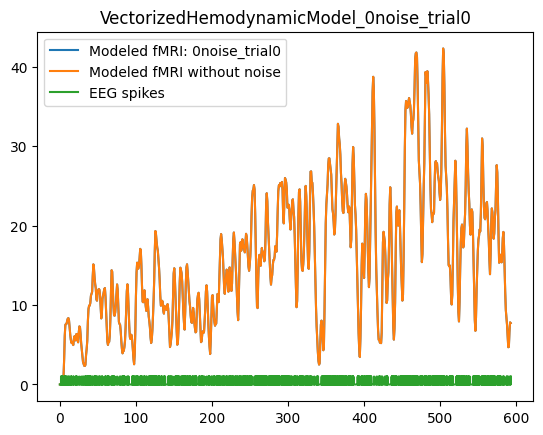

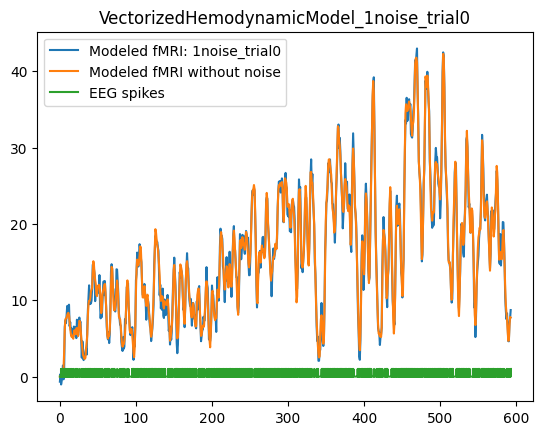

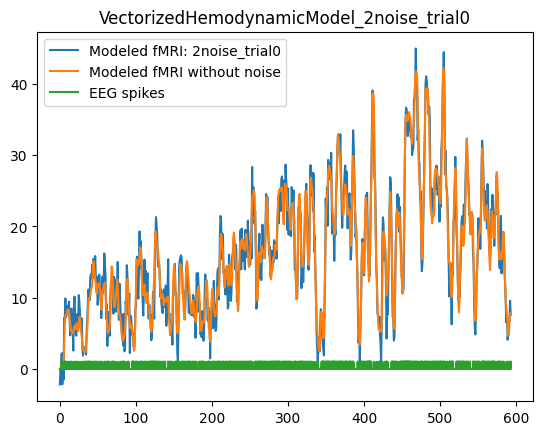

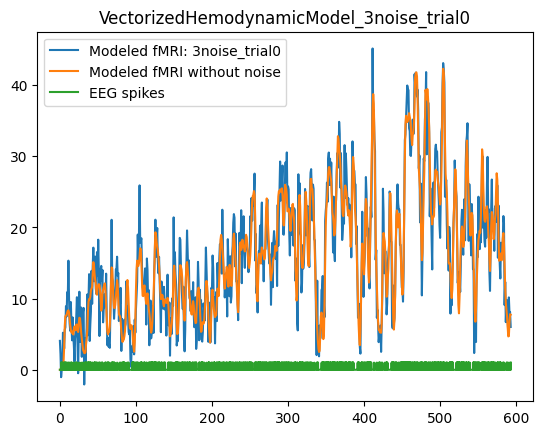

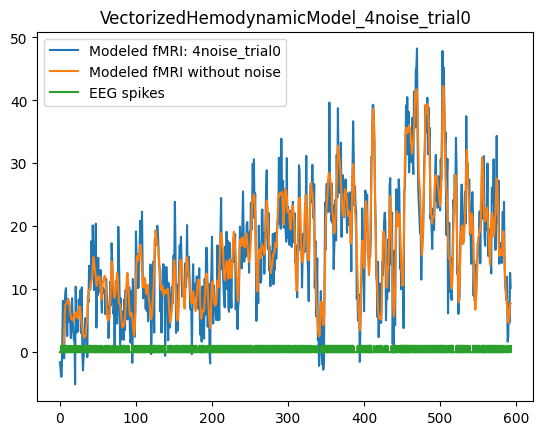

...

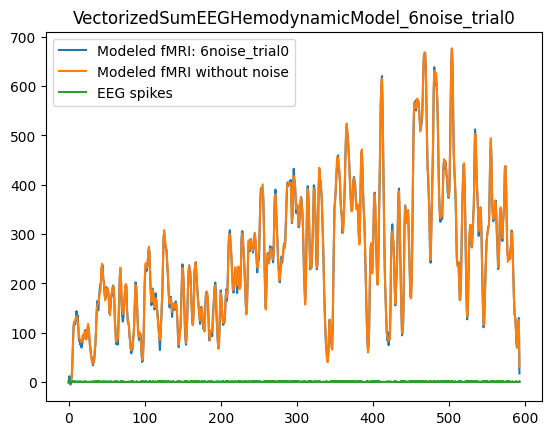

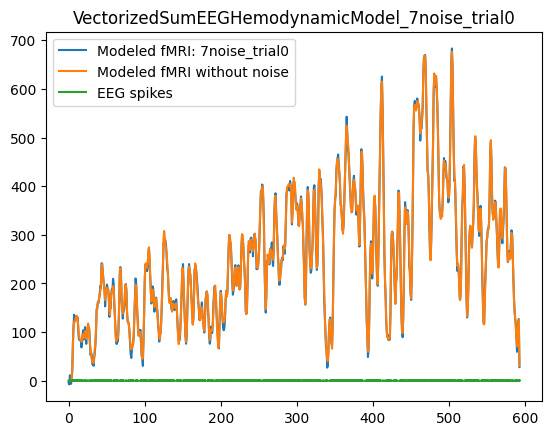

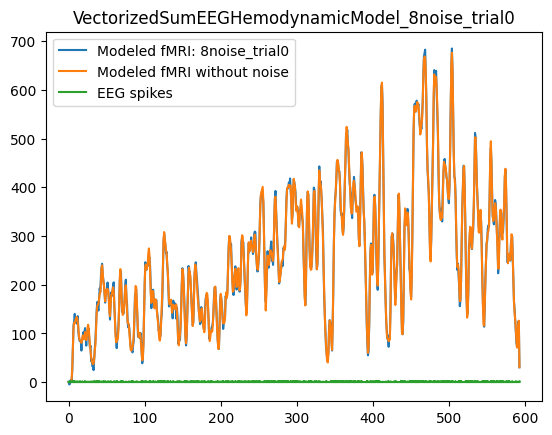

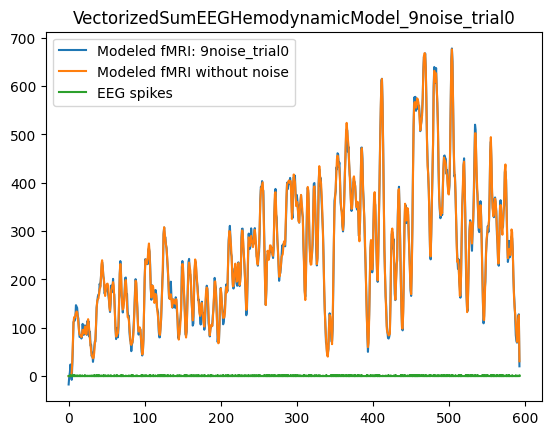

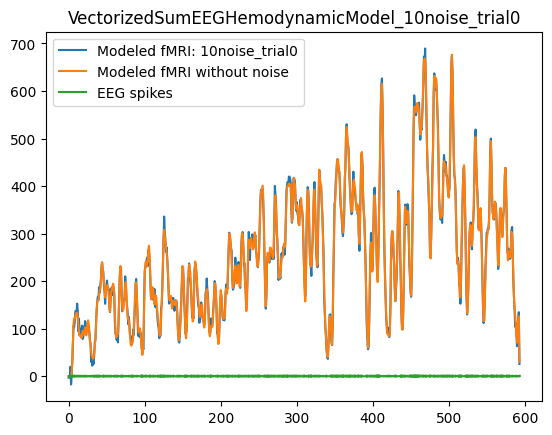

In [6]:
model_to_fmri = dict()

for model, attrs in models_to_test.items():
    fmri_data_options = {}
    fmri_to_plot = []
    name = f'0noise_trial0'
    fmri_data_options[name] = attrs['fmri_data_generator'](
        tr, 
        r_fmri, 
        eeg_data_options['without_nans'],
        hrf,
        0,
        plot=plot_generated_data,
        title=f'{model.__name__}_{name}',
        name = name,
    )
    if plot_perfect_comparison:
        fmri_to_plot.append(name)
    for trial in range(num_trials):
        for noise in noise_range:
            name = f'{noise}noise_trial{trial}'
            fmri_data_options[name] = attrs['fmri_data_generator'](
                tr, 
                r_fmri, 
                eeg_data_options['without_nans'],
                hrf,
                noise,
                plot=plot_generated_data if trial==0 else False,
                title=f'{model.__name__}_{name}',
                name=name
            )
            if noise in noises_to_plot and trial < num_trials_to_plot:
                fmri_to_plot.append(name)
    model_to_fmri[model] = ModelToFMRI(
        name=attrs['name'],
        fmri_data_options=fmri_data_options,
        fmri_to_plot=fmri_to_plot
    )


In [7]:
step_size = 16

filename_substring = f'effect_of_step_size_step_{step_size}'
filename_ext = '.csv'
plot = True

delta = get_suitable_range(1, 3, step_size)
tau = get_suitable_range(0.75, 1.75, step_size)
alpha = get_suitable_range(1.75, 2.25, step_size)

print(f'Delta target: {expected_delta}, Range:\n{delta}\n')
print(f'Tau target: {expected_tau}, Range:\n{tau}\n')
print(f'Alpha target: {expected_alpha}, Range:\n{alpha}\n')

Delta target: 2.25, Range:
[1.         1.13333333 1.26666667 1.4        1.53333333 1.66666667
 1.8        1.93333333 2.06666667 2.2        2.33333333 2.46666667
 2.6        2.73333333 2.86666667 3.        ]

Tau target: 1.25, Range:
[0.75       0.81666667 0.88333333 0.95       1.01666667 1.08333333
 1.15       1.21666667 1.28333333 1.35       1.41666667 1.48333333
 1.55       1.61666667 1.68333333 1.75      ]

Alpha target: 2, Range:
[1.75       1.78333333 1.81666667 1.85       1.88333333 1.91666667
 1.95       1.98333333 2.01666667 2.05       2.08333333 2.11666667
 2.15       2.18333333 2.21666667 2.25      ]



In [8]:
models = {}
for hemodynamic_model in model_to_fmri:
    fmri_names = [fmri_name for fmri_name in model_to_fmri[hemodynamic_model]['fmri_data_options'].keys()]
    fmri_data = np.array([fmri.data for fmri in model_to_fmri[hemodynamic_model]['fmri_data_options'].values()])
    fmri = fMRIData(data=fmri_data, TR=tr, voxel_names=fmri_names)
    for eeg_data_name, eeg_data in eeg_data_options.items():
        name = f'{model_to_fmri[hemodynamic_model]["name"]}_{eeg_data_name}'
        models[name] = hemodynamic_model(
            eeg=eeg_data,
            fmri=fmri,
            name=name,
            n_tr_skip_beg=n_tr_skipped_at_beginning,
            hemodynamic_response_window=hemodynamic_response_window,
            plot=plot
        )
        models[name].set_plot_voxels(model_to_fmri[hemodynamic_model]['fmri_to_plot']) 


## Est vs Actual for all models at correct points

Scoring downsample_without_nans delta=2.25, tau=1.25, alpha=2


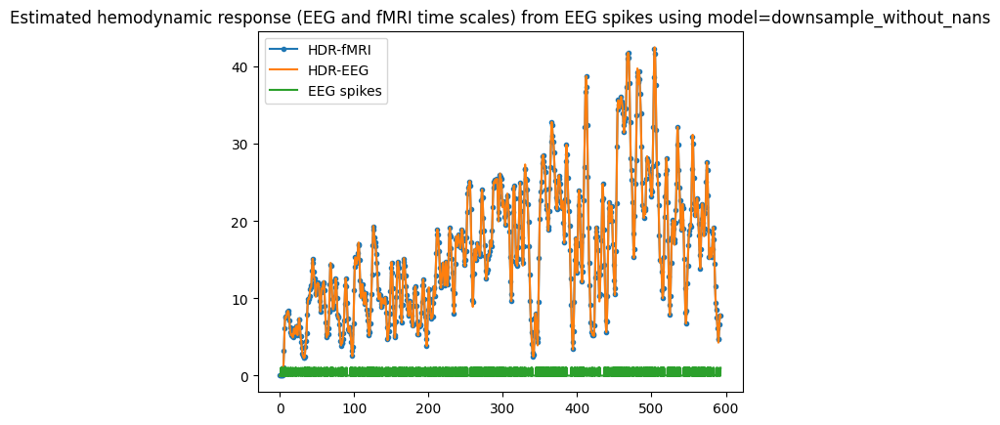

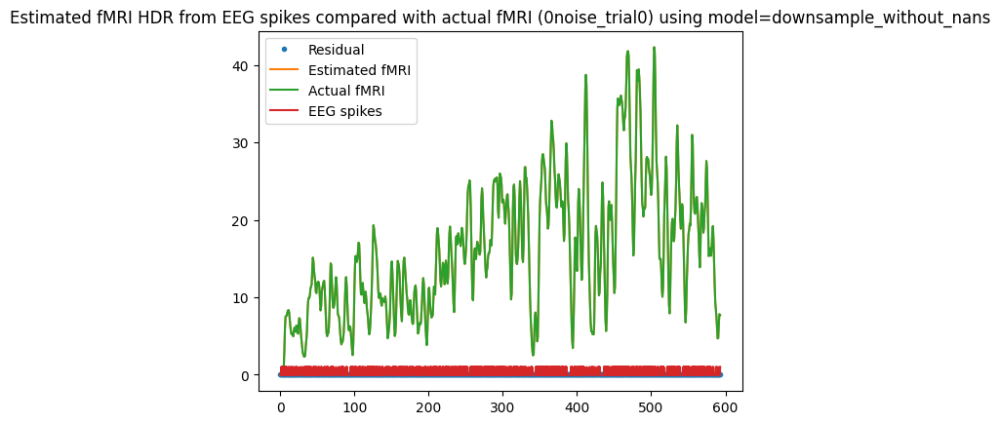

Residual Variance is 0.000000


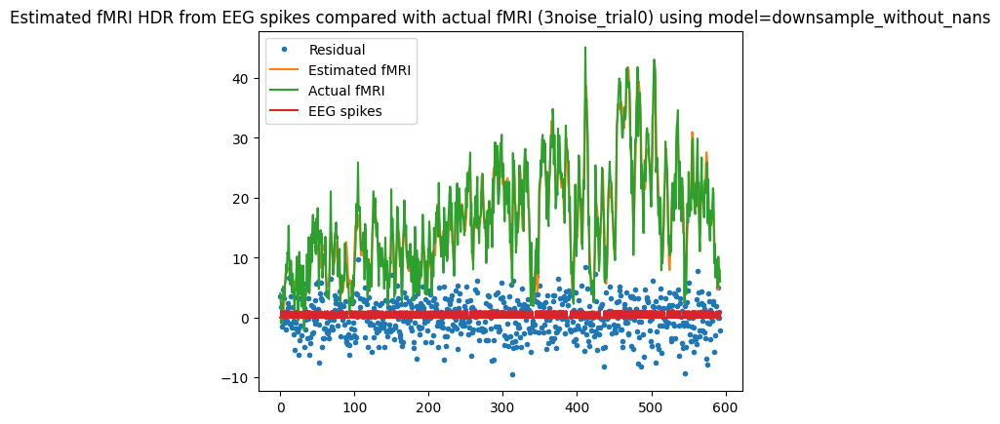

Residual Variance is 9.139474


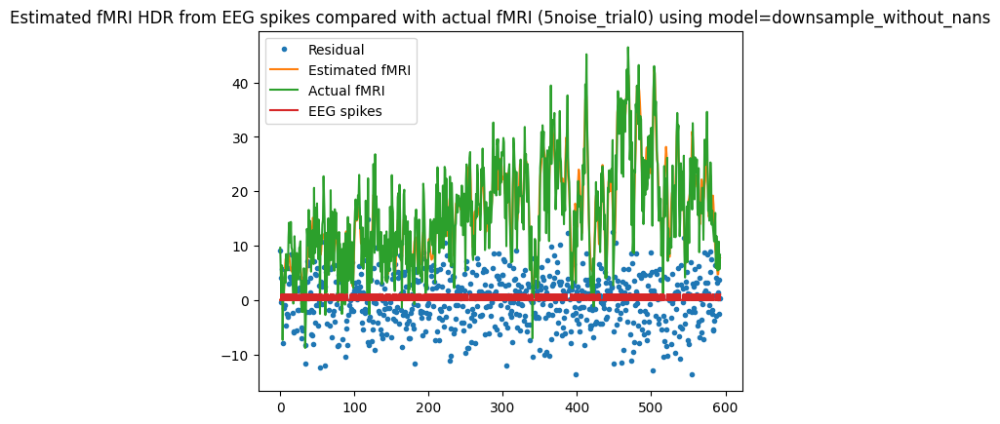

Residual Variance is 22.803364


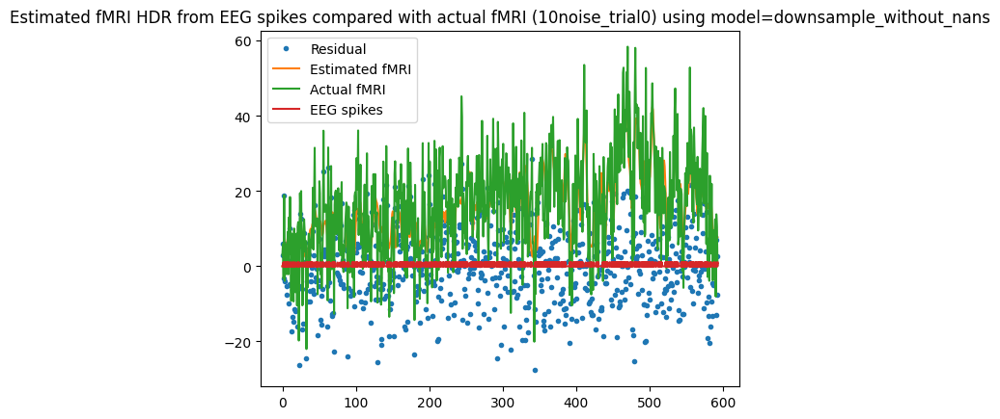

Residual Variance is 98.371246


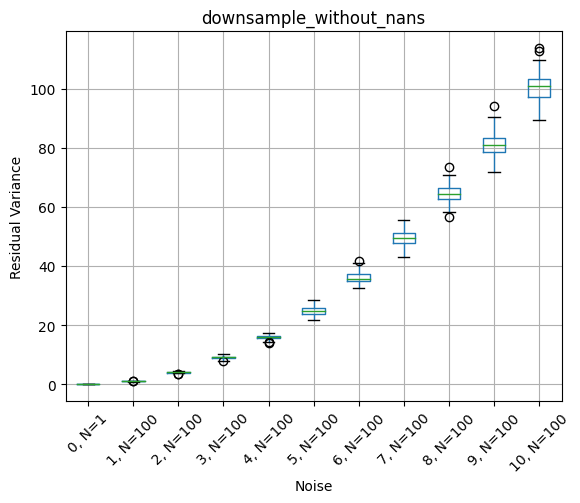

Scoring downsample_with_nans delta=2.25, tau=1.25, alpha=2


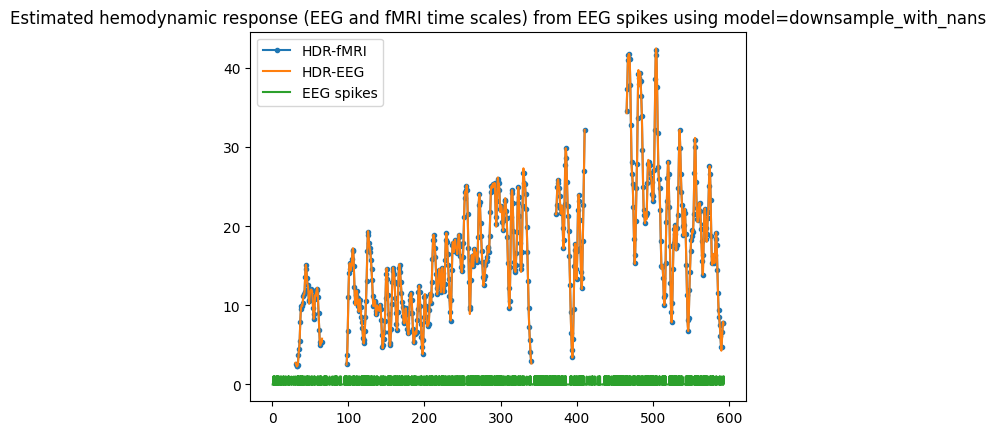

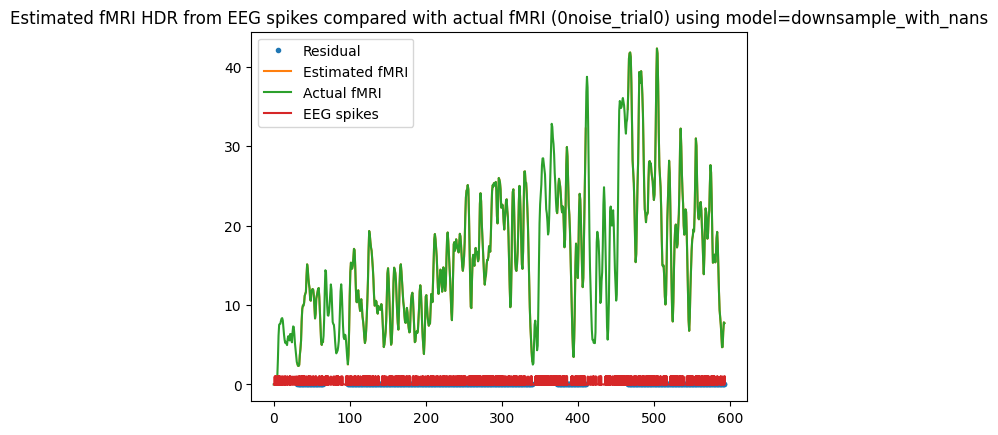

Residual Variance is 0.000000


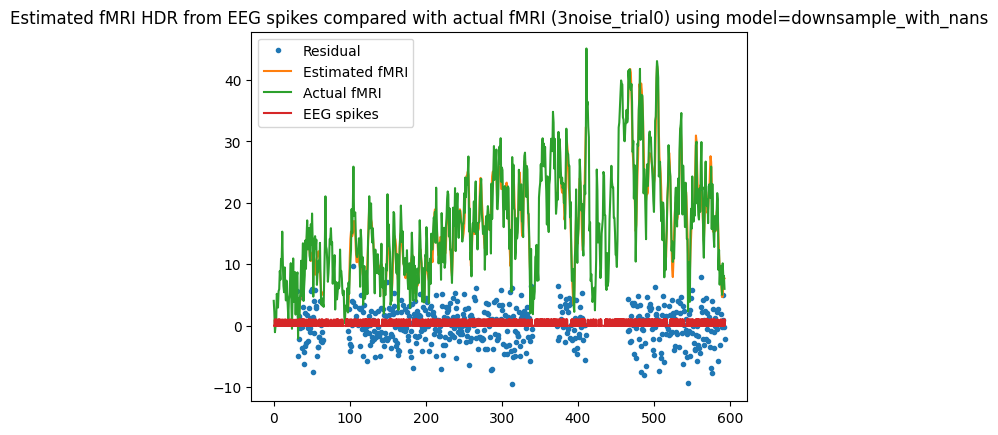

Residual Variance is 9.318652


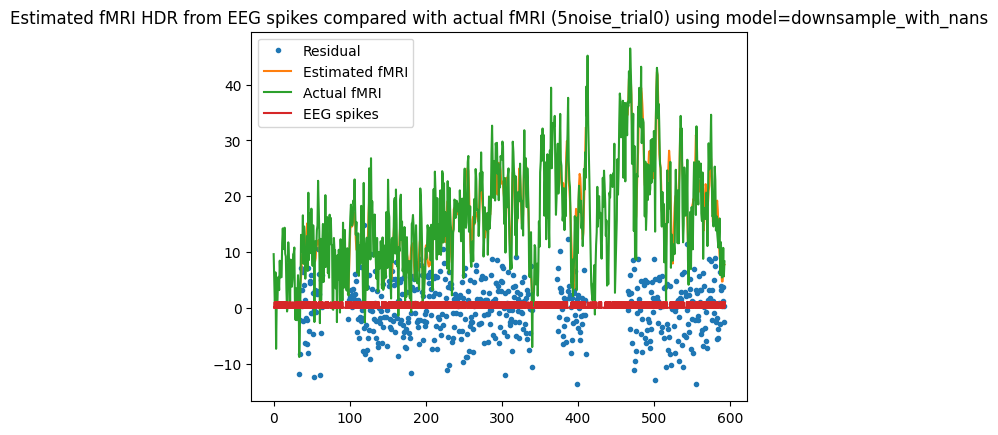

Residual Variance is 23.447293


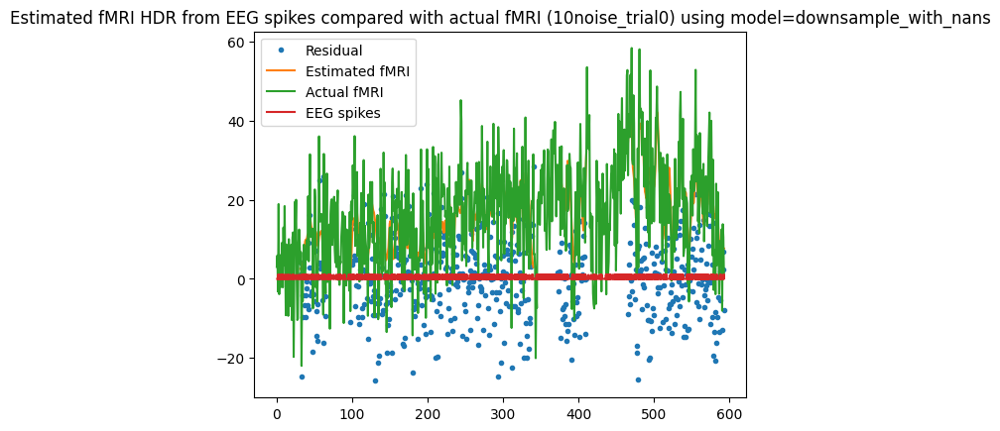

Residual Variance is 98.581668


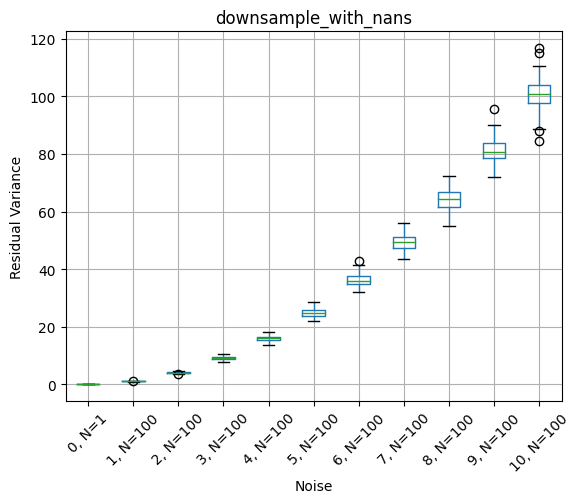

Scoring sum_without_nans delta=2.25, tau=1.25, alpha=2


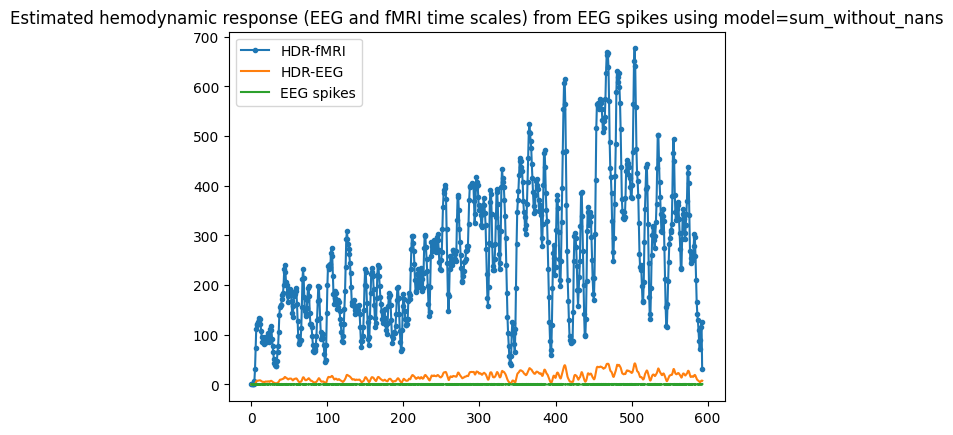

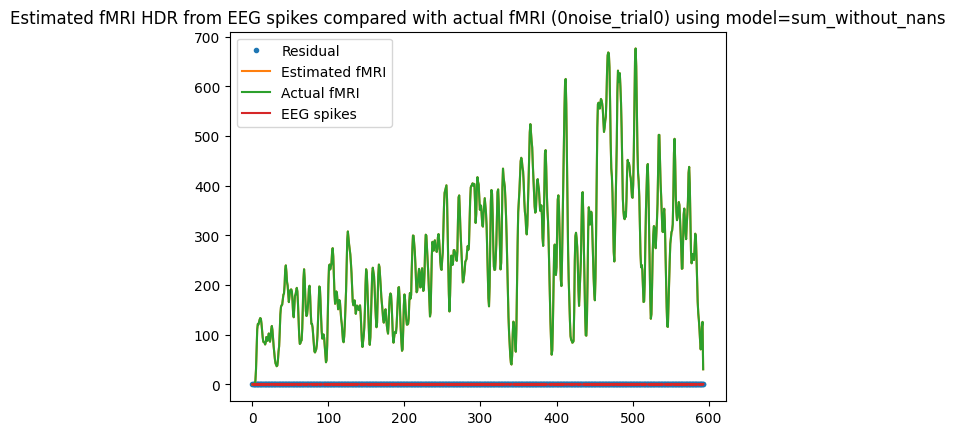

Residual Variance is 0.000000


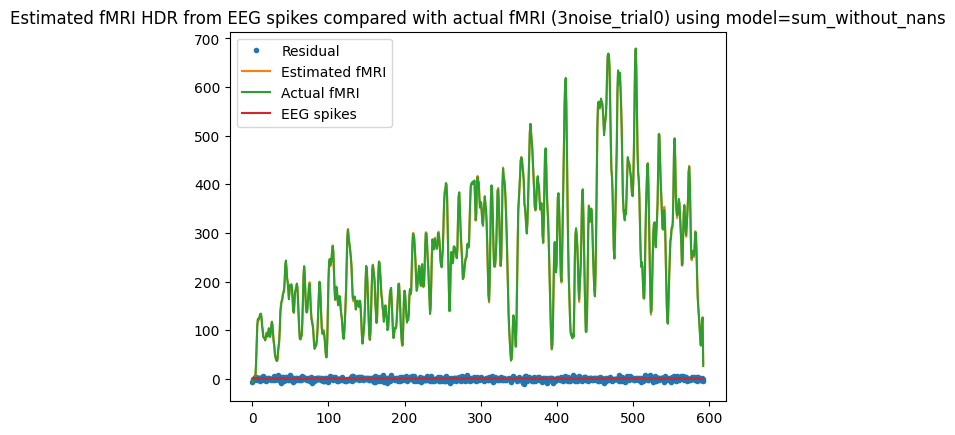

Residual Variance is 8.993199


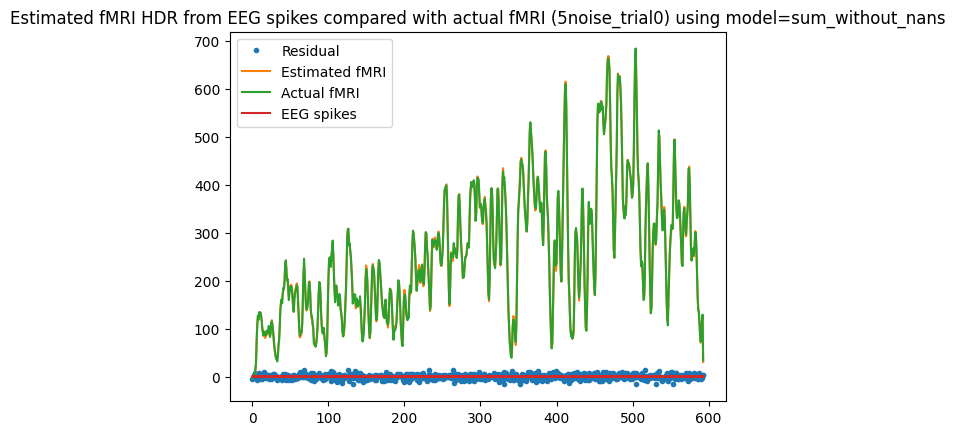

Residual Variance is 24.781095


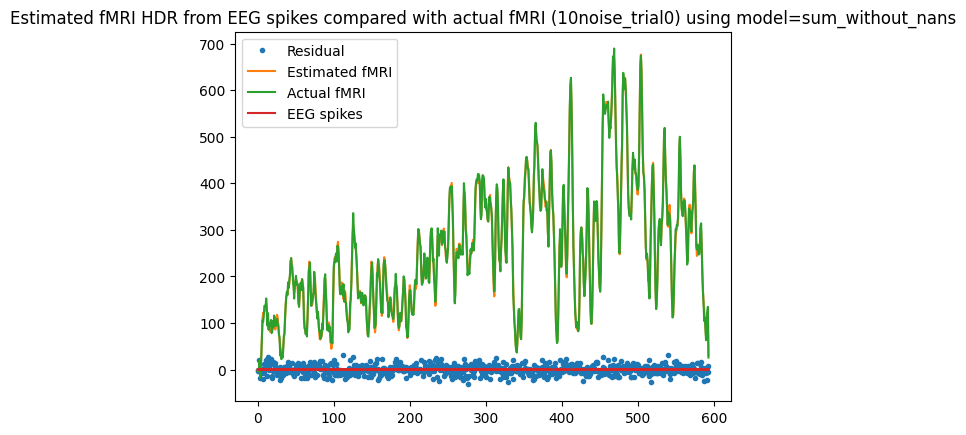

Residual Variance is 102.783930


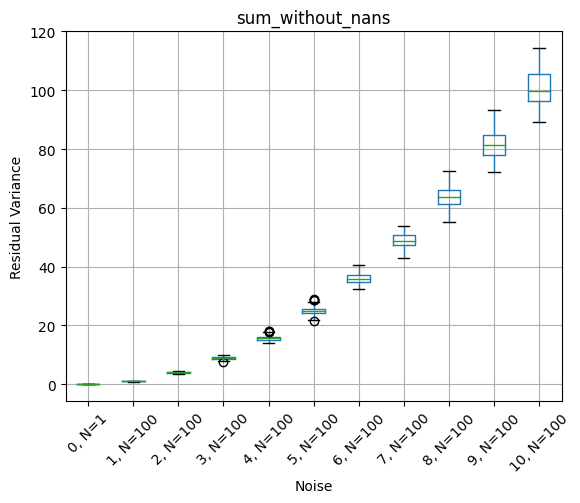

Scoring sum_with_nans delta=2.25, tau=1.25, alpha=2


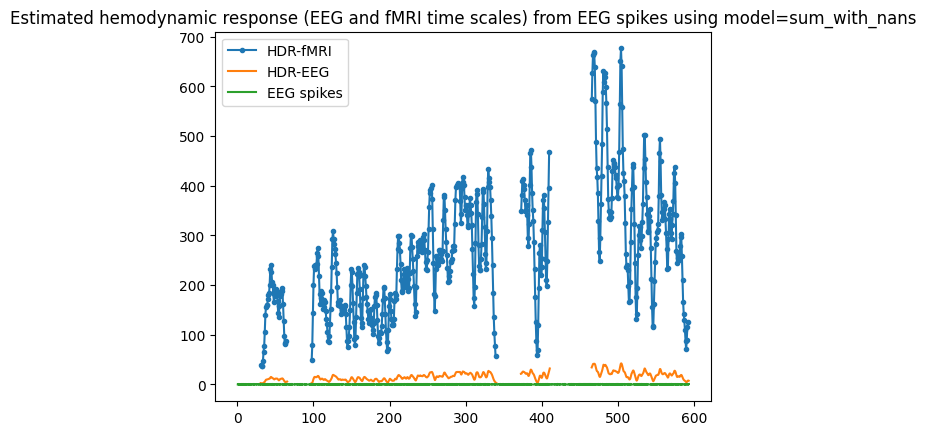

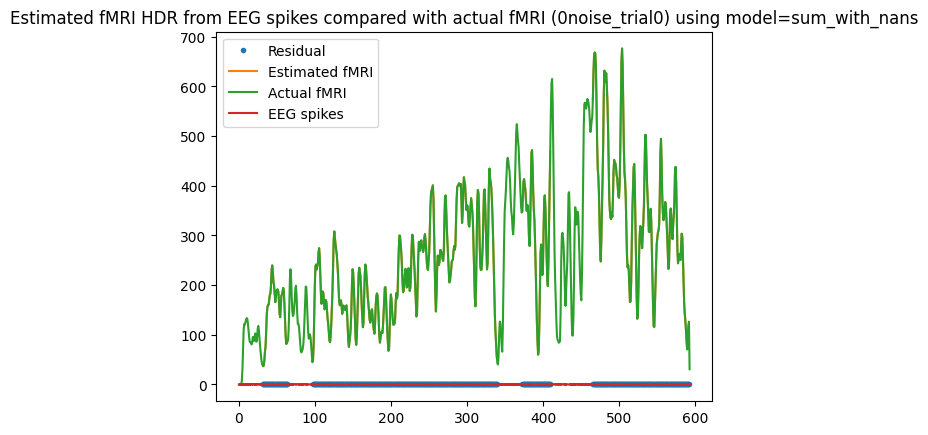

Residual Variance is 0.000000


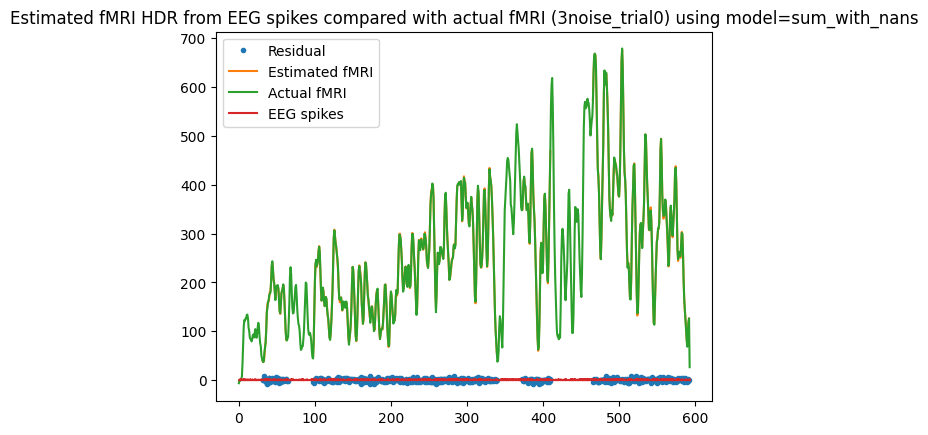

Residual Variance is 8.963286


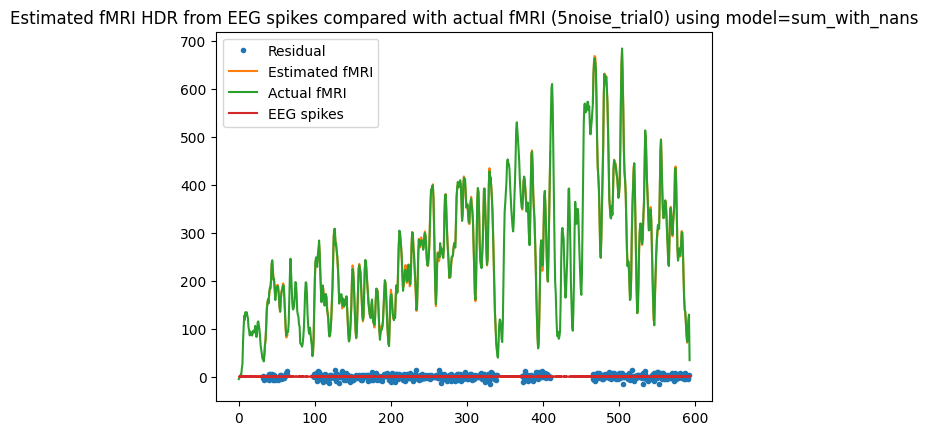

Residual Variance is 24.116401


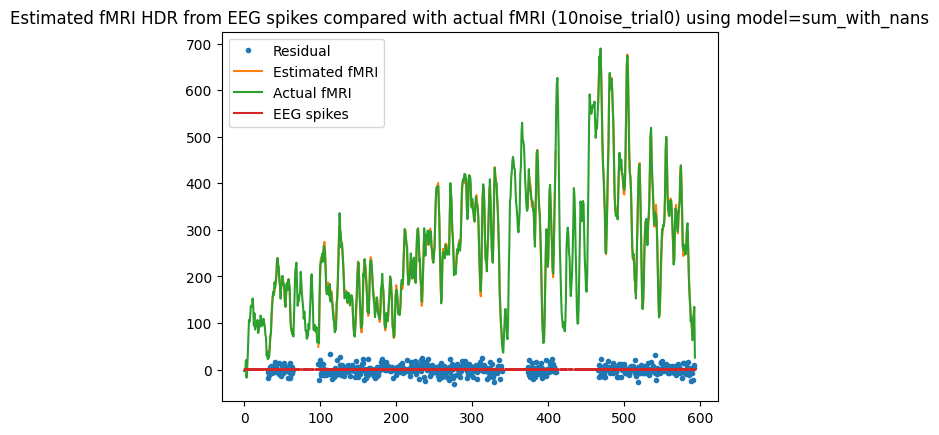

Residual Variance is 101.048660


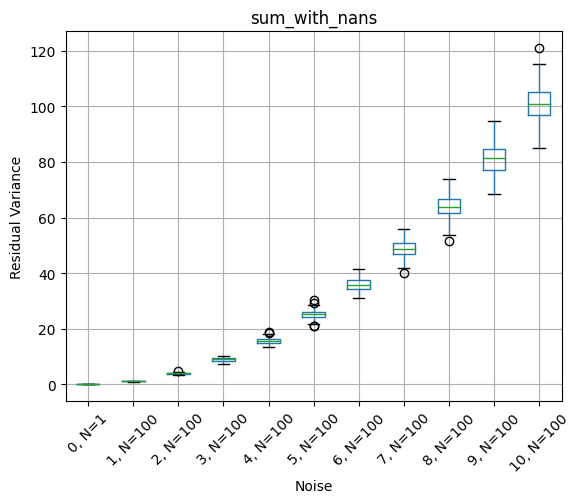

In [9]:
# Get in-depth plots for actual delta, tau, alpha
for model_name, model in models.items():
    residual_var = model.score(expected_delta, expected_tau, expected_alpha)
    fmri_names = np.array(model.fmri.voxel_names)
    if (fmri_names == None).any():
        print(f'Residual variance was {residual_var}')
    else:
        noise_levels = np.char.replace(fmri_names, 'perfect', '0noise_trail0')
        noise_levels = np.char.partition(noise_levels, sep='noise')
        res_var_df = pd.DataFrame(zip(noise_levels[:,0].astype(int), residual_var), columns=['Noise', 'res_var'])
        res_var_by_noise = res_var_df.groupby('Noise')
        _, axs = plt.subplots()
        axs.set_title(model_name)
        axs.set_ylabel('Residual Variance')
        axs.set_xlabel('Noise')
        axs = res_var_by_noise.boxplot(column='res_var', subplots=False, rot=45, ax=axs)
        labels = res_var_by_noise.count()
        labels = [f'{noise}, N={n.item()}' for noise, n in zip(labels.index, labels.values)]
        plt.setp(axs, xticklabels=labels)
        plt.show()
    model.plot = False


## Generate/Load the full dataset

In [10]:
# Optional Reuse functionality

df = pd.DataFrame()
descriptions = []

if try_to_reuse:
    matching_files = sorted(glob.glob(f'{filename_substring}*{filename_ext}'))
    filename_to_use = "none"
    if len(matching_files) != 0:
        filename_to_use = input(
            f'Found previously run data. Enter name to reuse or "none" to recalculate.'
            f'\n{matching_files}\nDefault ({matching_files[-1]})\n'
        )
    if filename_to_use.lower() != "none":
        if filename_to_use.strip() == '':
            filename_to_use = matching_files[-1]
        print(f'Loading data from {filename_to_use}...')
        with open(filename_to_use, 'r') as f:
            df = pd.read_csv(f, index_col=0)
        descriptions = generate_descriptions_from_search_df(df, models)


Found previously run data. Enter name to reuse or "none" to recalculate.
['effect_of_step_size_step_16_2023-04-05_14:14.csv']
Default (effect_of_step_size_step_16_2023-04-05_14:14.csv)

Loading data from effect_of_step_size_step_16_2023-04-05_14:14.csv...


In [11]:
if df.empty:
    print('Generating data!')
    descriptions, df = search_voxels(models, delta, tau, alpha)
    with open(f'{filename_substring}_{datetime.now().strftime("%Y-%m-%d_%H:%M")}{filename_ext}', 'w') as f:
        pd.DataFrame(df).to_csv(f)
    for model_name, description in zip(models.keys(), descriptions):
        with open(f'{model_name}_summary_{filename_substring}_{datetime.now().strftime("%Y-%m-%d_%H:%M")}{filename_ext}', 'w') as f:
            pd.DataFrame(description).transpose().to_csv(f)

## Cost by Noise

### Downsample without Missing Data

Minimal Cost for Average Cost: noise 1 (downsample_without_nans) = 1.0054333259668122; at
      delta       tau     alpha
9708    2.2  1.216667  2.116667


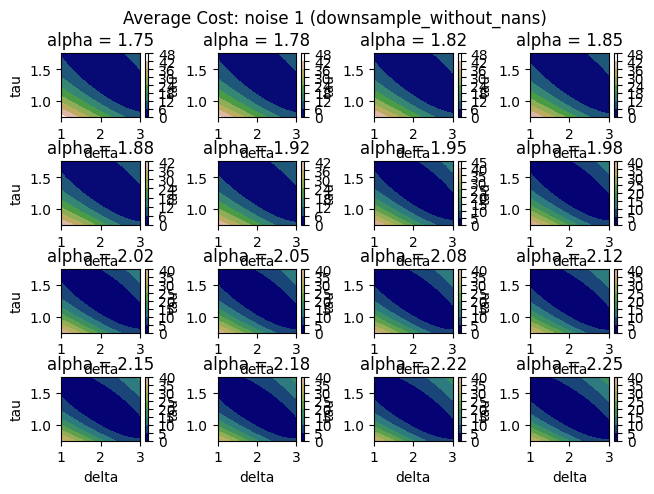

Minimal Cost for Average Cost: noise 2 (downsample_without_nans) = 4.022640132300147; at
      delta       tau     alpha
9708    2.2  1.216667  2.116667


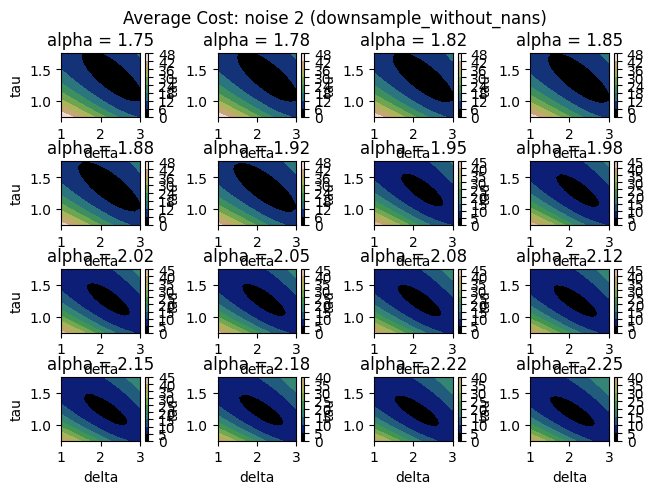

Minimal Cost for Average Cost: noise 3 (downsample_without_nans) = 9.013984453138317; at
      delta       tau     alpha
9708    2.2  1.216667  2.116667


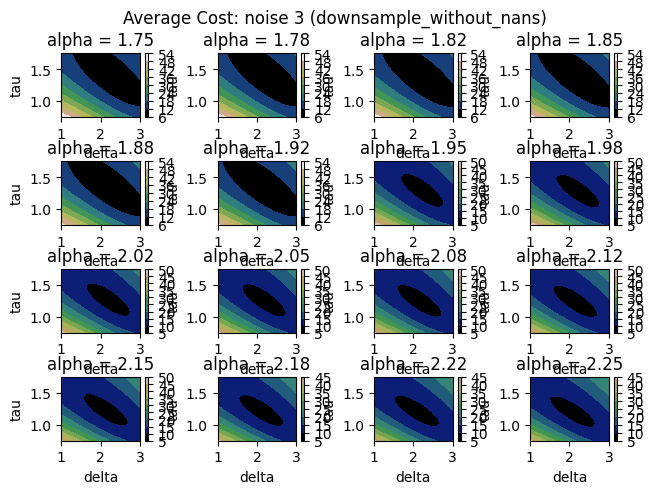

Minimal Cost for Average Cost: noise 4 (downsample_without_nans) = 15.955395168355963; at
      delta       tau     alpha
9708    2.2  1.216667  2.116667


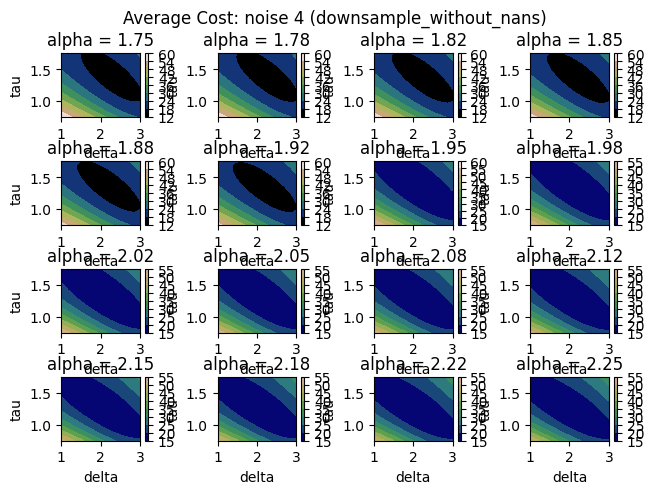

Minimal Cost for Average Cost: noise 5 (downsample_without_nans) = 24.992265640746588; at
      delta       tau     alpha
9708    2.2  1.216667  2.116667


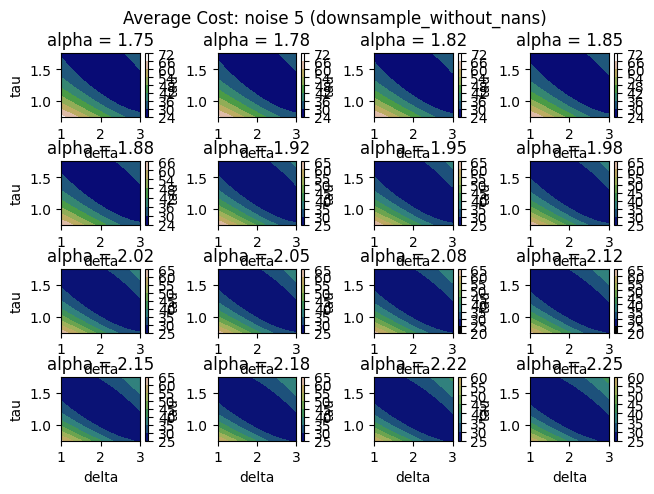

Minimal Cost for Average Cost: noise 6 (downsample_without_nans) = 36.068312100001904; at
      delta       tau     alpha
9708    2.2  1.216667  2.116667


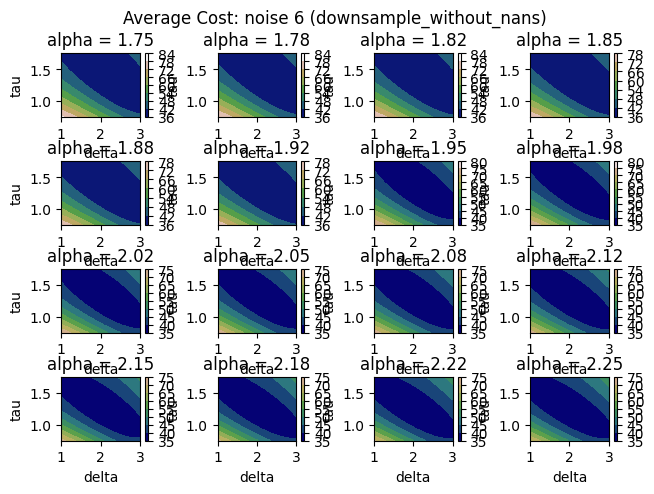

Minimal Cost for Average Cost: noise 7 (downsample_without_nans) = 49.293702138472135; at
          delta   tau  alpha
10816  2.333333  1.35   1.75


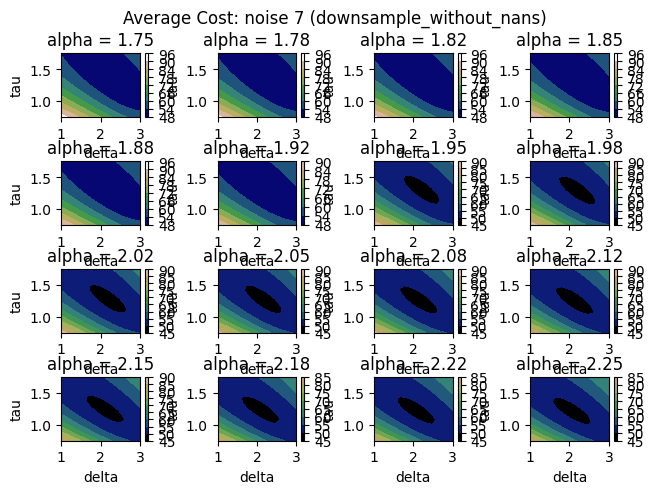

Minimal Cost for Average Cost: noise 8 (downsample_without_nans) = 63.85568079065848; at
      delta       tau     alpha
9704    2.2  1.216667  2.083333


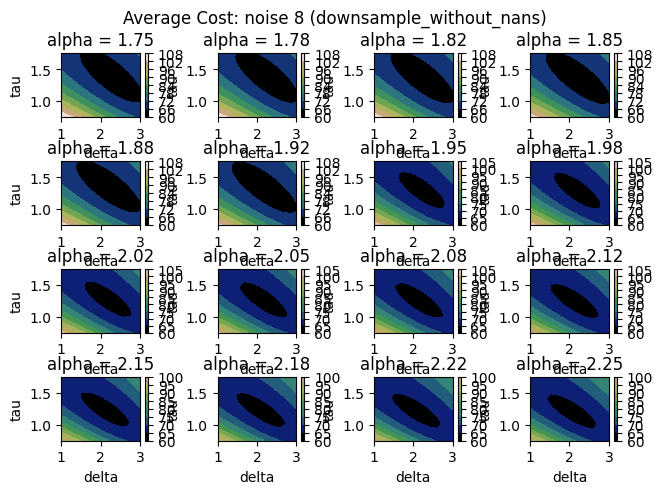

Minimal Cost for Average Cost: noise 9 (downsample_without_nans) = 81.14810526984007; at
      delta       tau     alpha
9708    2.2  1.216667  2.116667


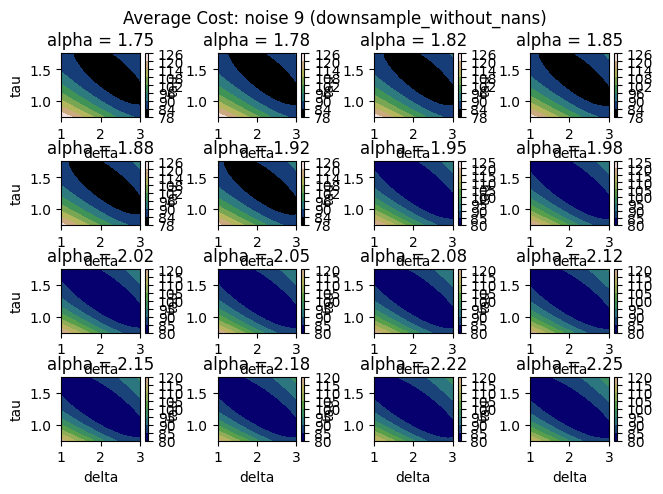

Minimal Cost for Average Cost: noise 10 (downsample_without_nans) = 99.34763390442959; at
         delta       tau  alpha
8700  2.066667  1.216667   2.25


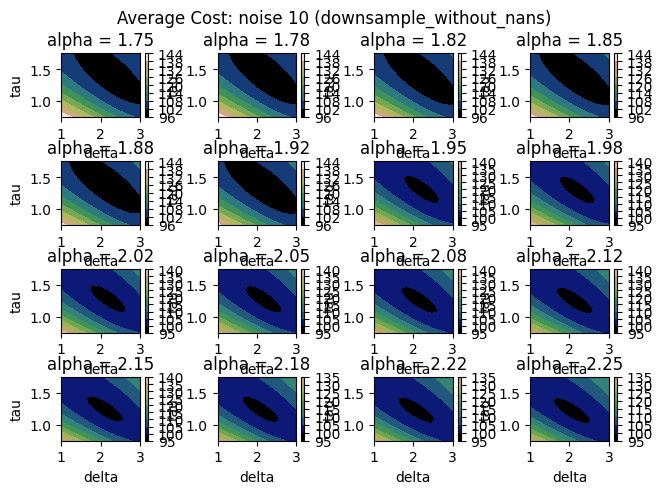

In [43]:
model_name = 'downsample_without_nans'
for noise in noise_range:
    df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]

    average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
    average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
    plot_all_search_results_2d(average_df, separate_by='alpha')

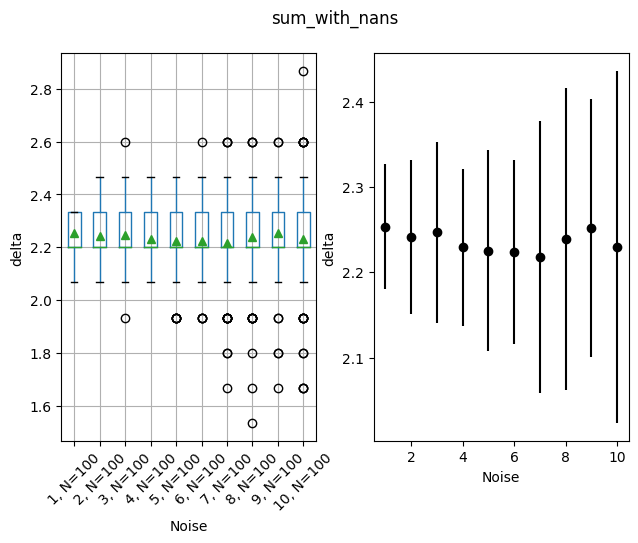

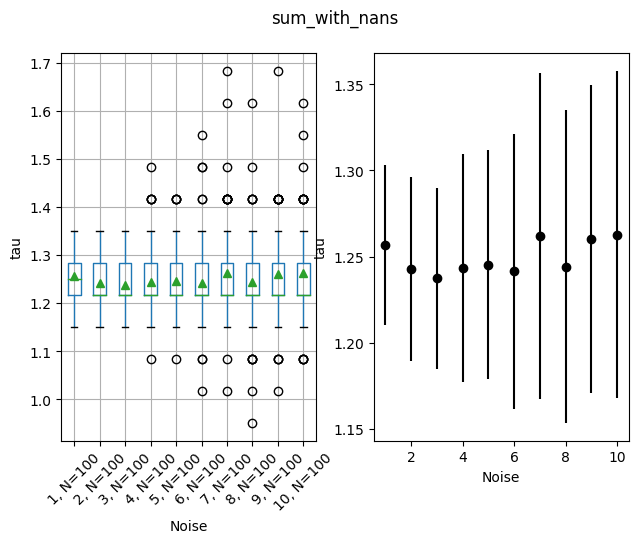

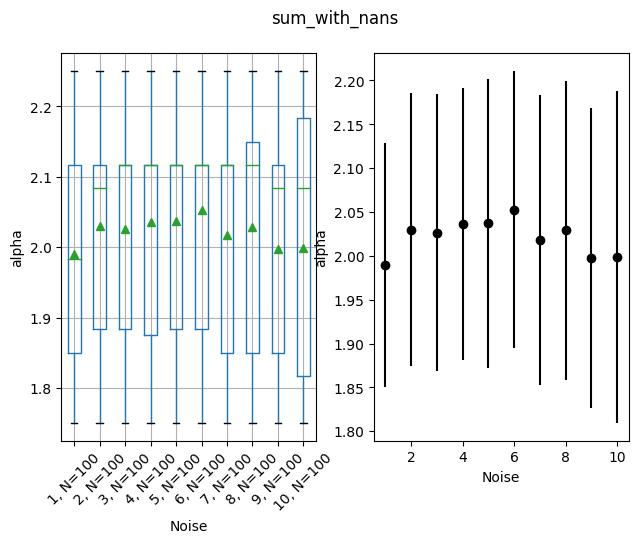

In [122]:
data = []
df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
for noise in noise_range:
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]
    for point in zip(*np.where(~np.isnan(df[columns_for_noise][df[columns_for_noise] == df[columns_for_noise].min()].to_numpy()))):
        row_of_interest = df.iloc[point[0]]
        data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])

chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable in ['delta', 'tau', 'alpha']:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(model_name)
    fig.tight_layout()
    axs[0].set_ylabel(variable)
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_ylabel(variable)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(noise_range, chosen_points.mean()[variable], chosen_points.std()[variable], fmt='ok')
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()

### Downsample with Missing Data

Minimal Cost for Average Cost: noise 1 (downsample_with_nans) = 1.0026099883562538; at
      delta       tau     alpha
9709    2.2  1.216667  2.116667


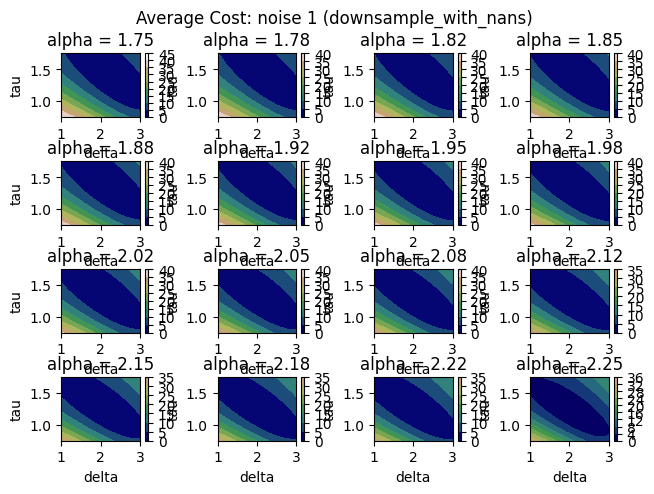

Minimal Cost for Average Cost: noise 2 (downsample_with_nans) = 4.020856411063411; at
      delta       tau     alpha
9709    2.2  1.216667  2.116667


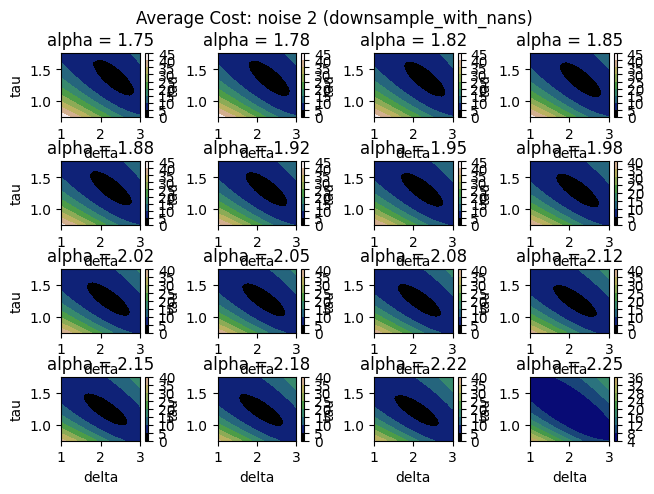

Minimal Cost for Average Cost: noise 3 (downsample_with_nans) = 8.960136368152343; at
      delta       tau     alpha
9709    2.2  1.216667  2.116667


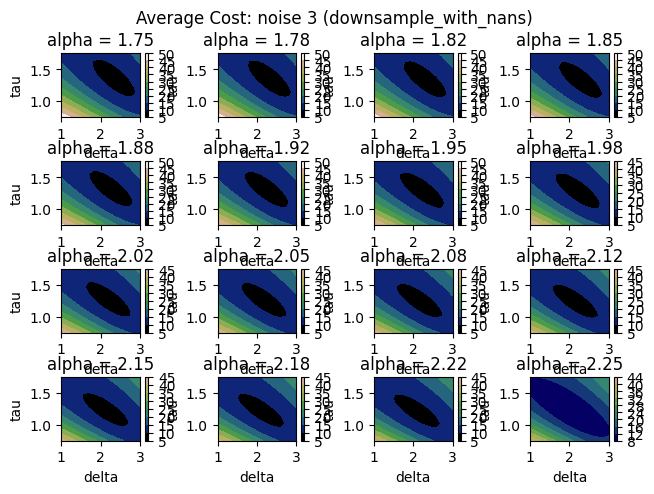

Minimal Cost for Average Cost: noise 4 (downsample_with_nans) = 15.994126076077185; at
      delta       tau     alpha
9709    2.2  1.216667  2.116667


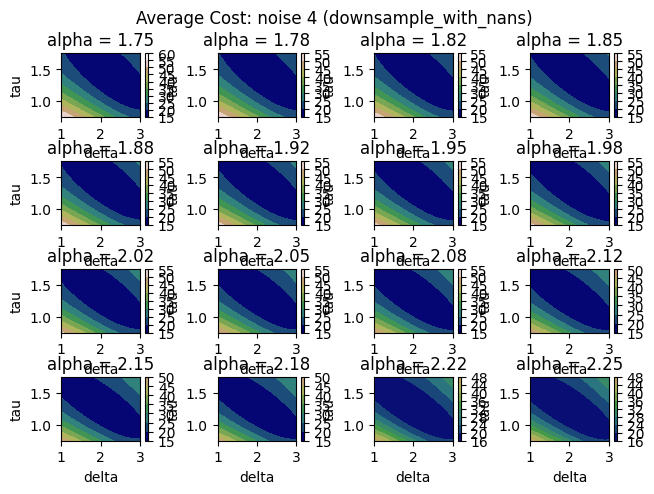

Minimal Cost for Average Cost: noise 5 (downsample_with_nans) = 24.940653188094252; at
      delta       tau     alpha
9709    2.2  1.216667  2.116667


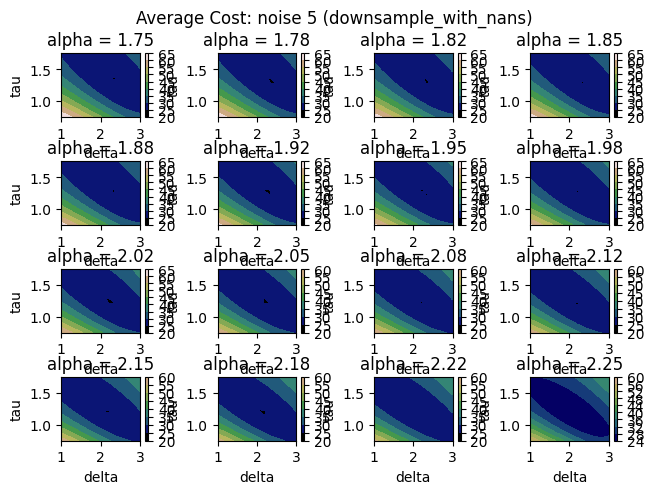

Minimal Cost for Average Cost: noise 6 (downsample_with_nans) = 36.2282836875266; at
      delta       tau     alpha
9709    2.2  1.216667  2.116667


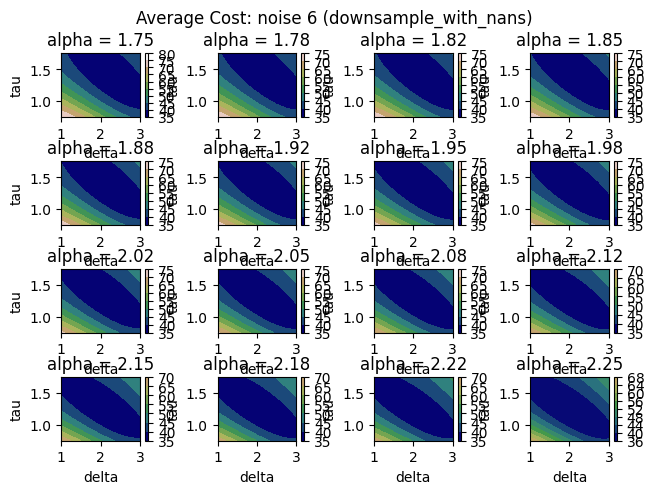

Minimal Cost for Average Cost: noise 7 (downsample_with_nans) = 49.25955814434851; at
          delta   tau  alpha
10817  2.333333  1.35   1.75


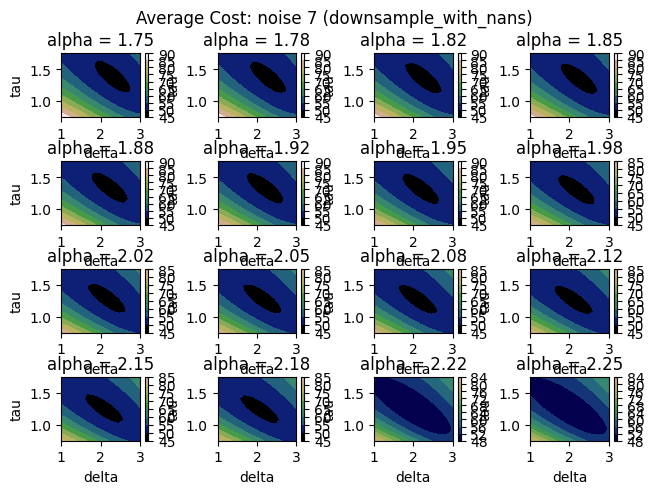

Minimal Cost for Average Cost: noise 8 (downsample_with_nans) = 63.607636591490085; at
      delta       tau     alpha
9709    2.2  1.216667  2.116667


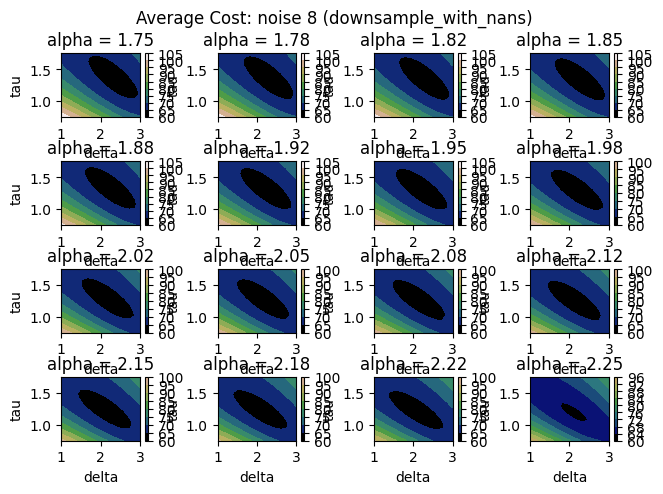

Minimal Cost for Average Cost: noise 9 (downsample_with_nans) = 81.11177485071762; at
          delta       tau     alpha
10769  2.333333  1.283333  1.883333


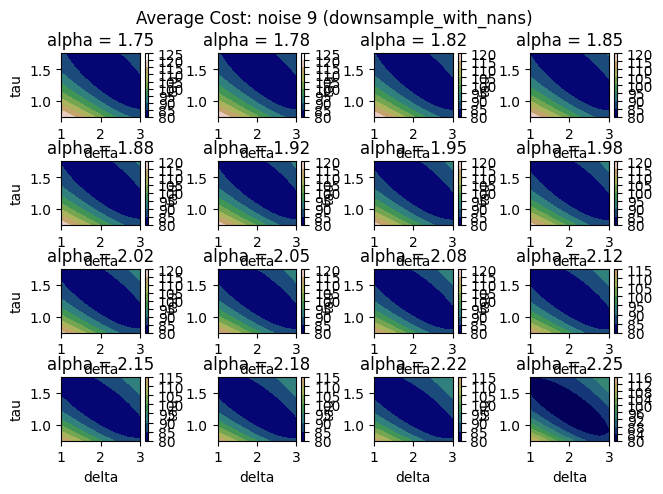

Minimal Cost for Average Cost: noise 10 (downsample_with_nans) = 99.46854555181372; at
      delta       tau     alpha
9709    2.2  1.216667  2.116667


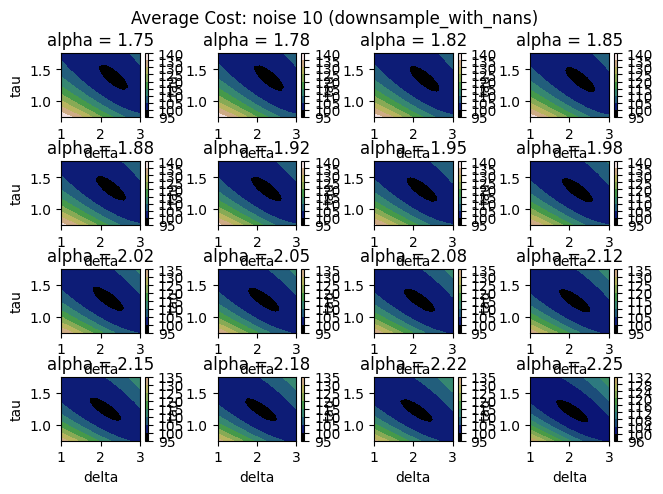

In [44]:
model_name = 'downsample_with_nans'
for noise in noise_range:
    df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]

    average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
    average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
    plot_all_search_results_2d(average_df, separate_by='alpha')

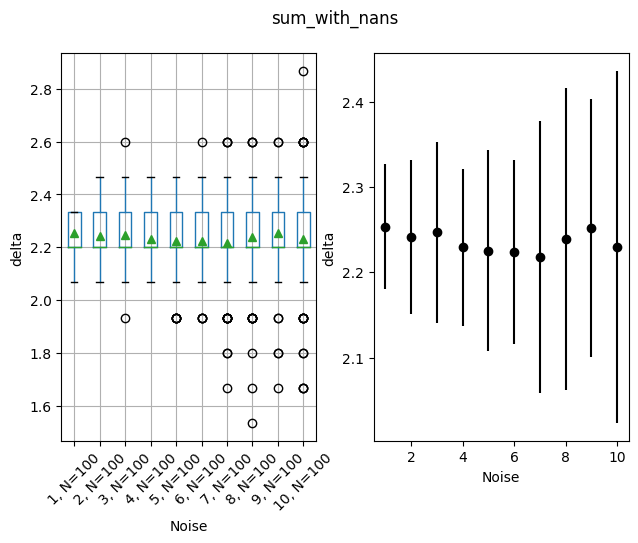

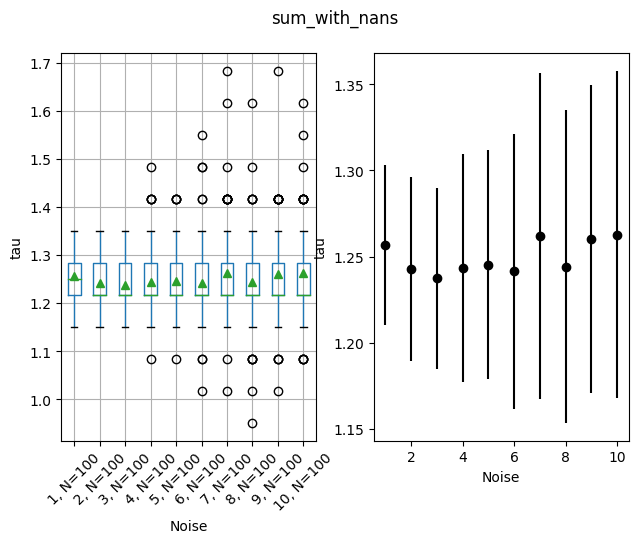

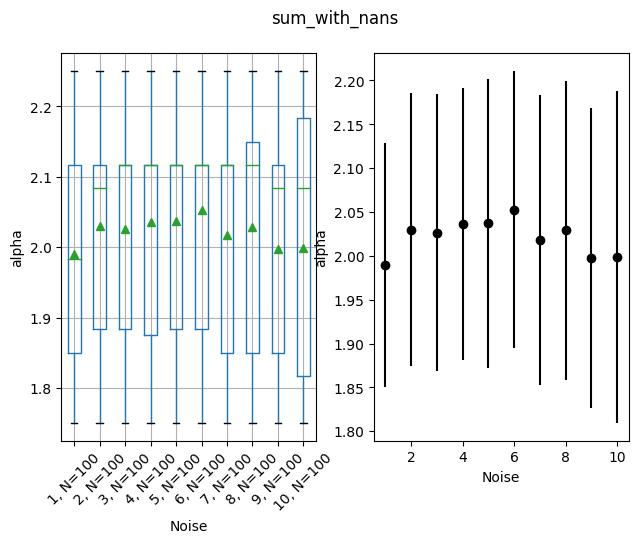

In [123]:
data = []
df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
for noise in noise_range:
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]
    for point in zip(*np.where(~np.isnan(df[columns_for_noise][df[columns_for_noise] == df[columns_for_noise].min()].to_numpy()))):
        row_of_interest = df.iloc[point[0]]
        data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])

chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable in ['delta', 'tau', 'alpha']:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(model_name)
    fig.tight_layout()
    axs[0].set_ylabel(variable)
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_ylabel(variable)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(noise_range, chosen_points.mean()[variable], chosen_points.std()[variable], fmt='ok')
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()

### Sum without Missing Data

Minimal Cost for Average Cost: noise 1 (sum_without_nans) = 1.2937165085011137; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


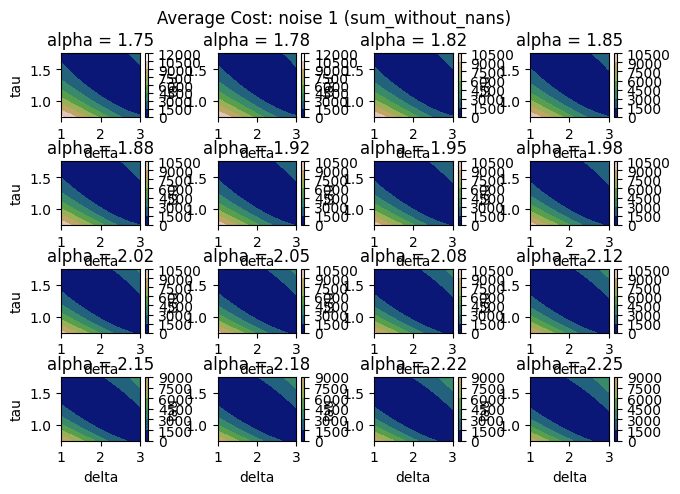

Minimal Cost for Average Cost: noise 2 (sum_without_nans) = 4.295872248558713; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


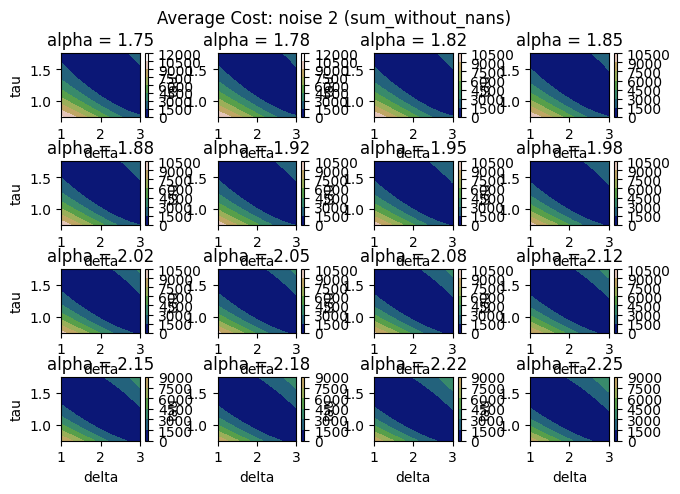

Minimal Cost for Average Cost: noise 3 (sum_without_nans) = 9.350780772173612; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


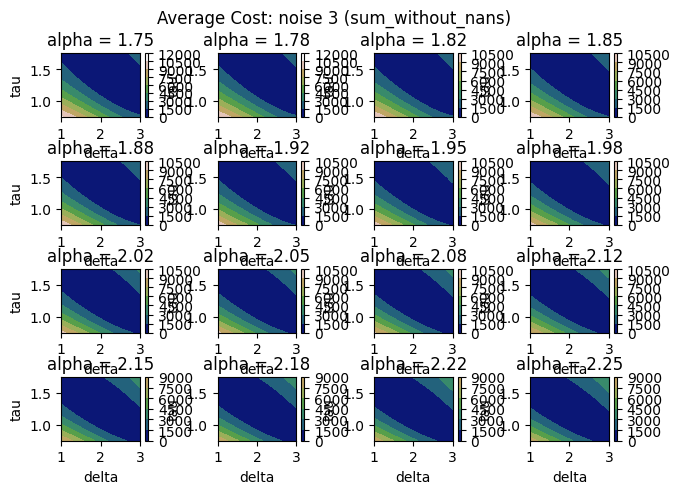

Minimal Cost for Average Cost: noise 4 (sum_without_nans) = 16.280884510612342; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


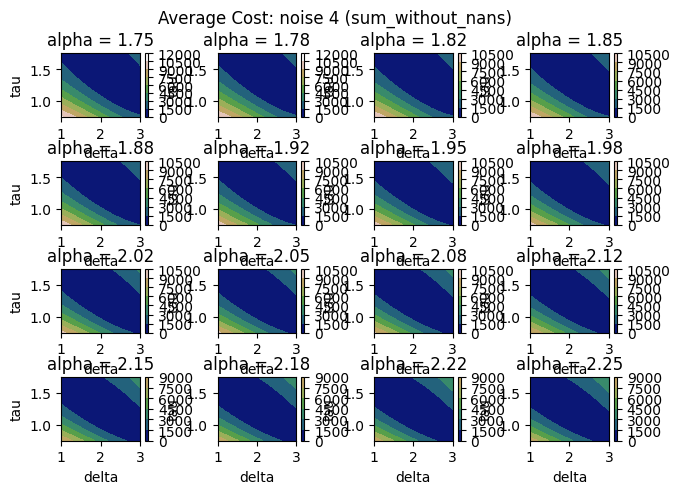

Minimal Cost for Average Cost: noise 5 (sum_without_nans) = 25.296280762699357; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


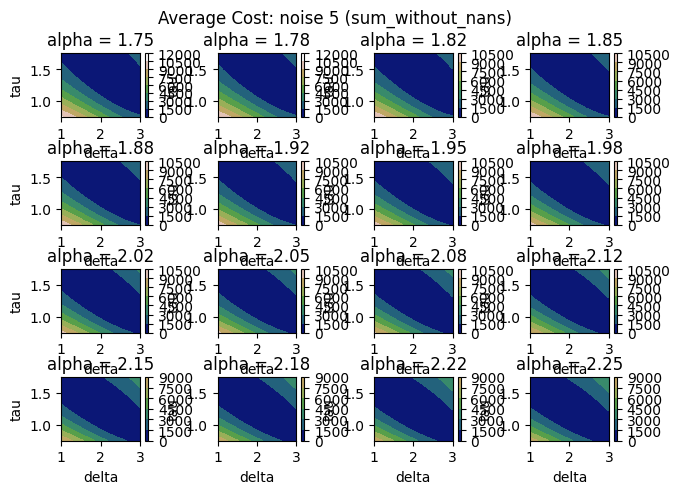

Minimal Cost for Average Cost: noise 6 (sum_without_nans) = 36.0473258679772; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


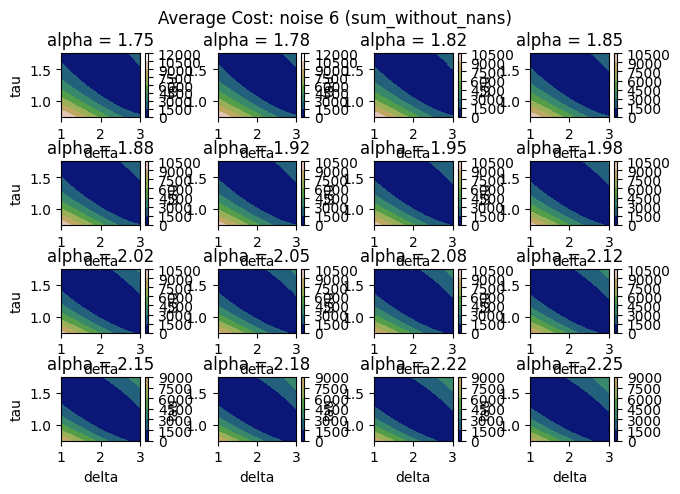

Minimal Cost for Average Cost: noise 7 (sum_without_nans) = 49.03901101314668; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


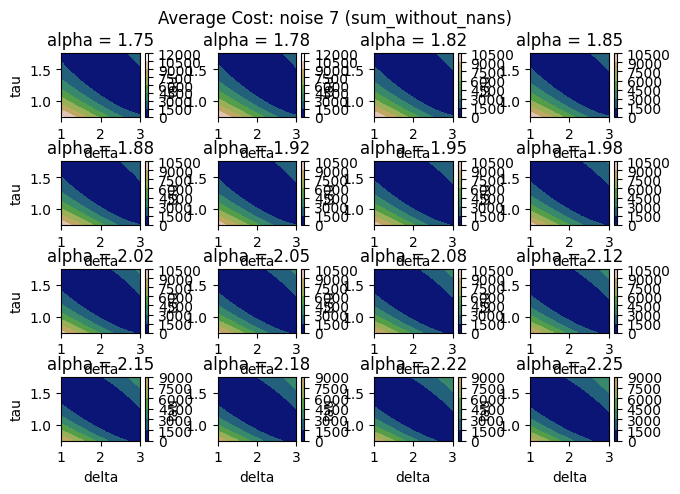

Minimal Cost for Average Cost: noise 8 (sum_without_nans) = 63.97016068518036; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


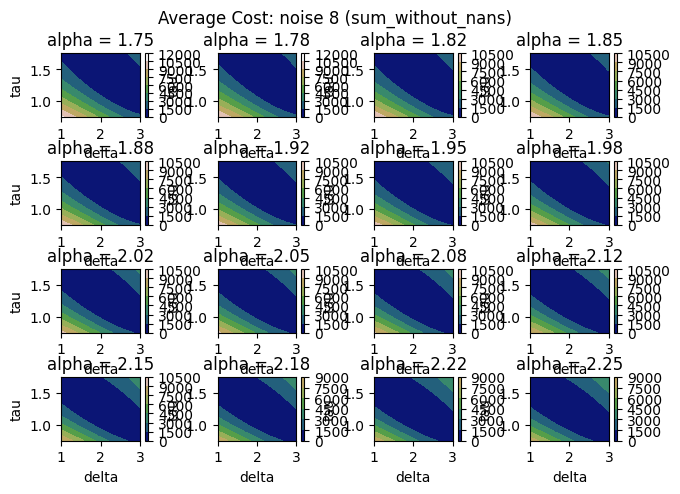

Minimal Cost for Average Cost: noise 9 (sum_without_nans) = 81.14832373043625; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


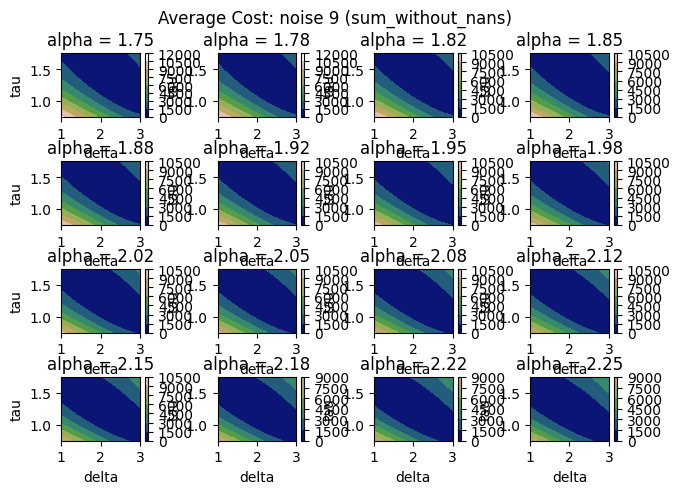

Minimal Cost for Average Cost: noise 10 (sum_without_nans) = 100.9946317825735; at
      delta       tau     alpha
9710    2.2  1.216667  2.116667


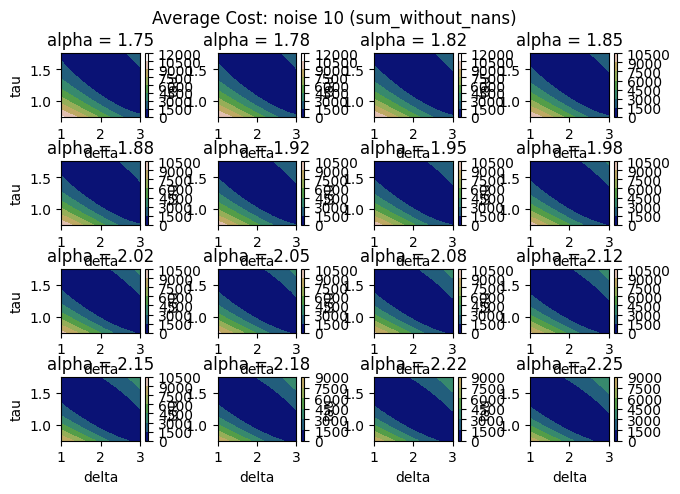

In [45]:
model_name = 'sum_without_nans'
for noise in noise_range:
    df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]

    average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
    average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
    plot_all_search_results_2d(average_df, separate_by='alpha')

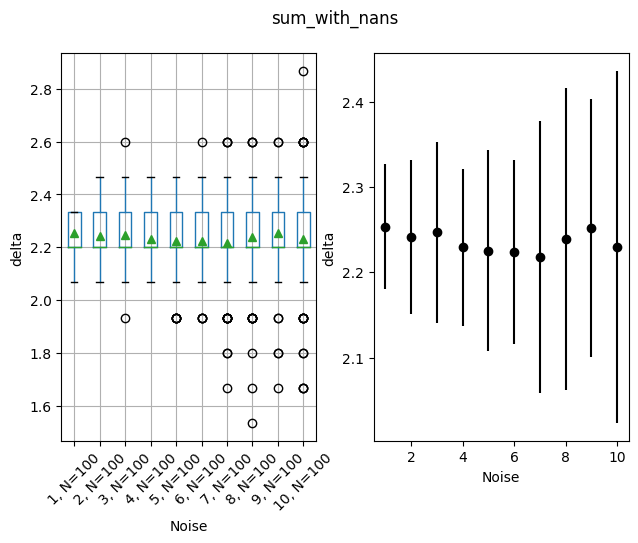

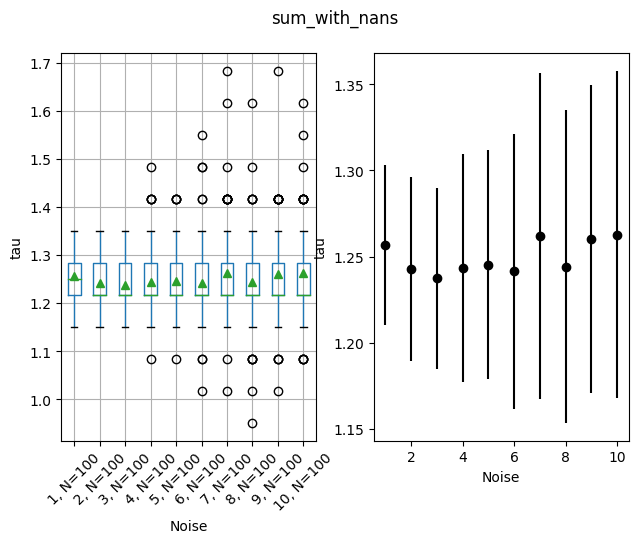

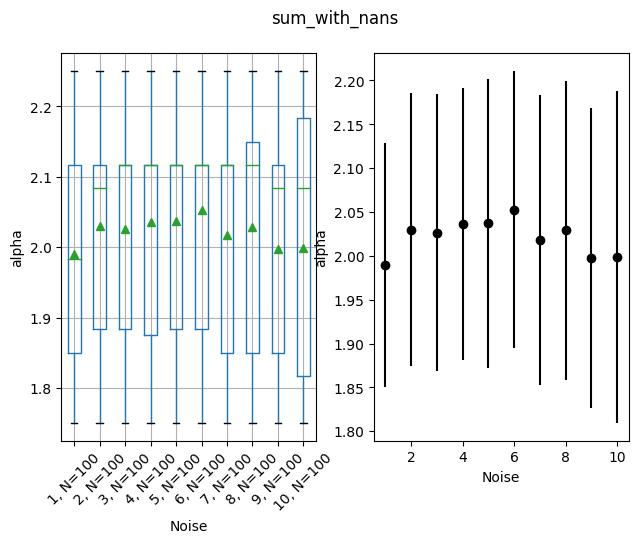

In [124]:
data = []
df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
for noise in noise_range:
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]
    for point in zip(*np.where(~np.isnan(df[columns_for_noise][df[columns_for_noise] == df[columns_for_noise].min()].to_numpy()))):
        row_of_interest = df.iloc[point[0]]
        data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])

chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable in ['delta', 'tau', 'alpha']:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(model_name)
    fig.tight_layout()
    axs[0].set_ylabel(variable)
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_ylabel(variable)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(noise_range, chosen_points.mean()[variable], chosen_points.std()[variable], fmt='ok')
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()

### Sum with Missing Data

Minimal Cost for Average Cost: noise 1 (sum_with_nans) = 1.295333141363526; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


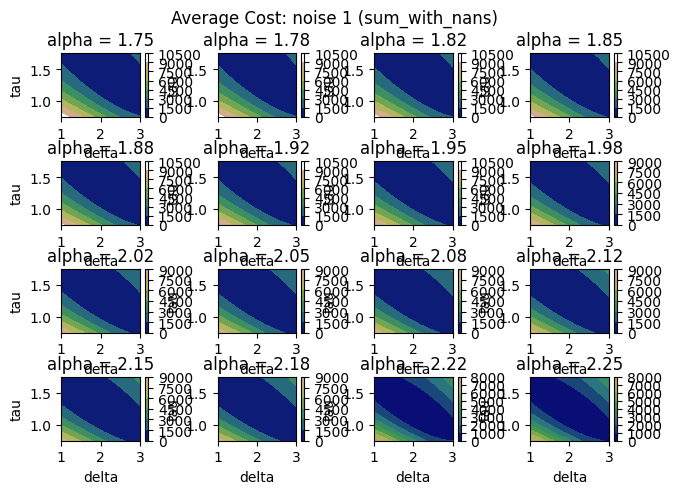

Minimal Cost for Average Cost: noise 2 (sum_with_nans) = 4.297603737948703; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


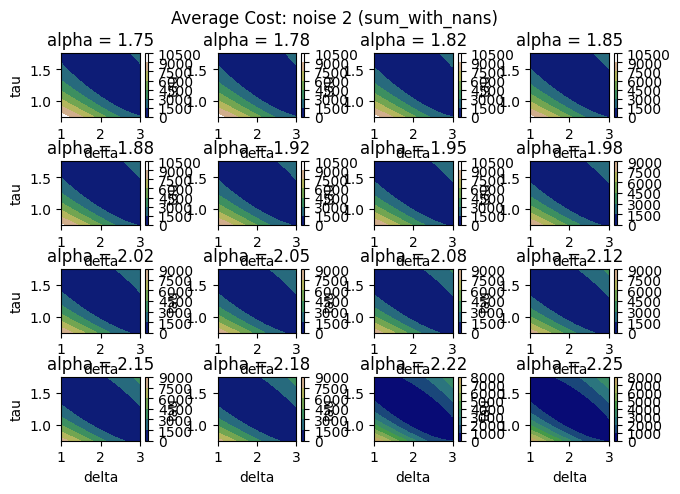

Minimal Cost for Average Cost: noise 3 (sum_with_nans) = 9.326442043253481; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


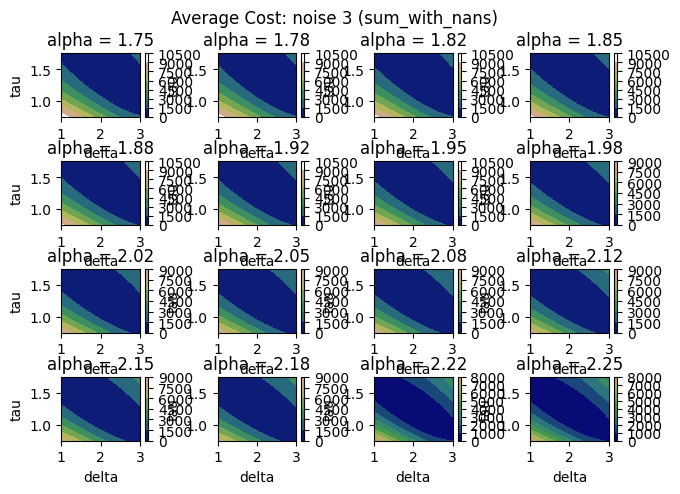

Minimal Cost for Average Cost: noise 4 (sum_with_nans) = 16.273924208398906; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


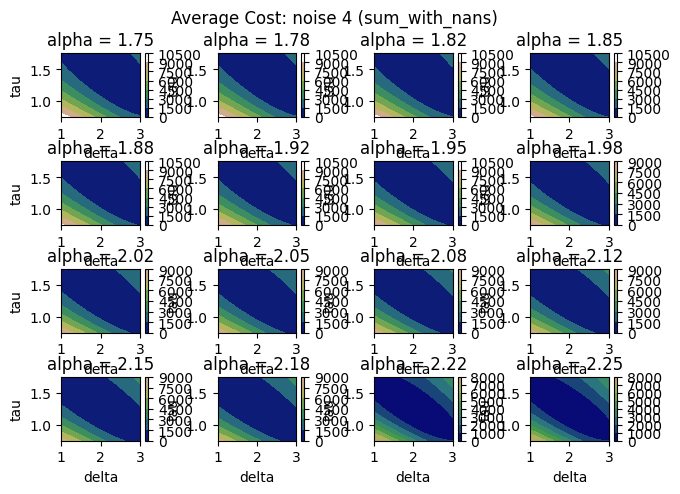

Minimal Cost for Average Cost: noise 5 (sum_with_nans) = 25.24859622957796; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


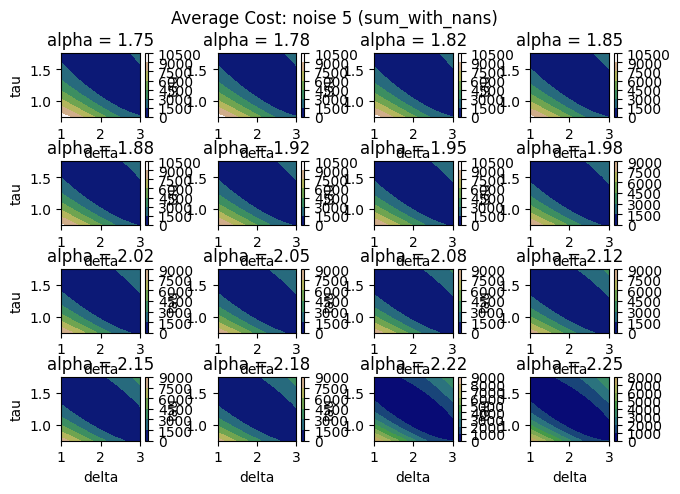

Minimal Cost for Average Cost: noise 6 (sum_with_nans) = 35.87951256839088; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


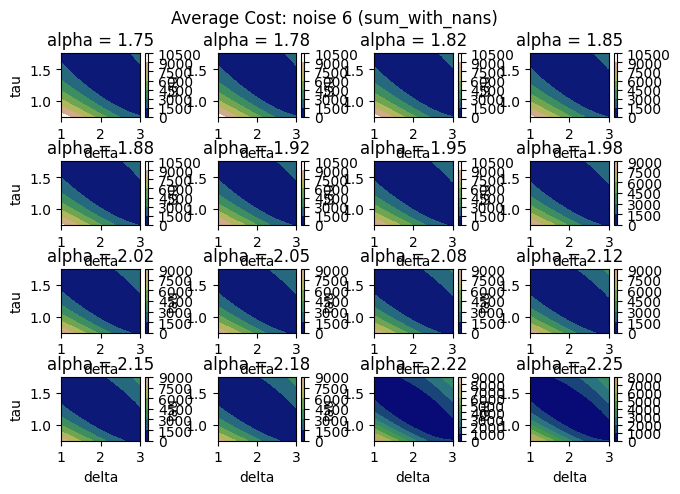

Minimal Cost for Average Cost: noise 7 (sum_with_nans) = 49.04892650921296; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


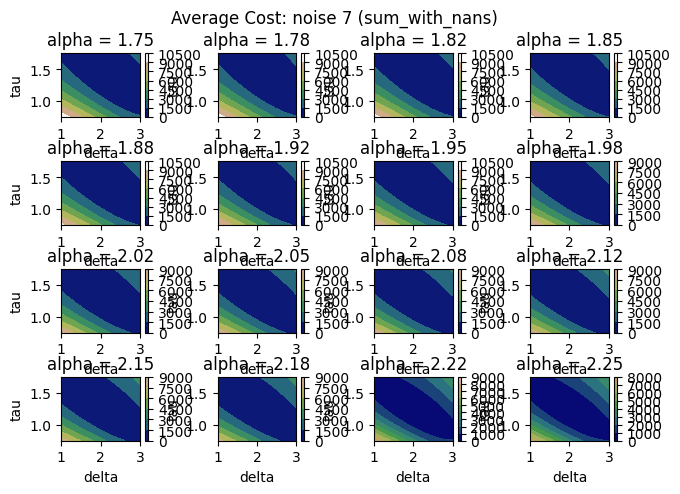

Minimal Cost for Average Cost: noise 8 (sum_with_nans) = 64.21506057437344; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


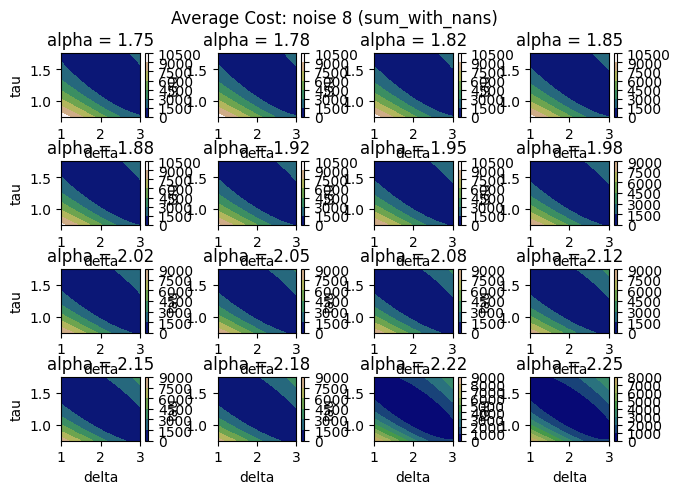

Minimal Cost for Average Cost: noise 9 (sum_with_nans) = 81.03487944375753; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


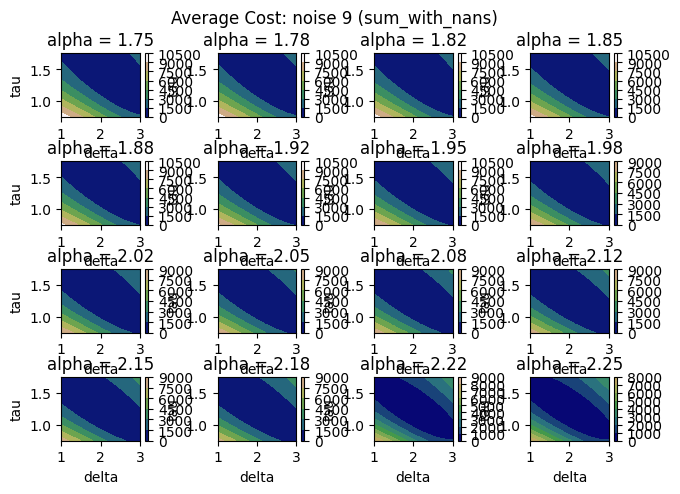

Minimal Cost for Average Cost: noise 10 (sum_with_nans) = 101.09899405041551; at
      delta       tau     alpha
9711    2.2  1.216667  2.116667


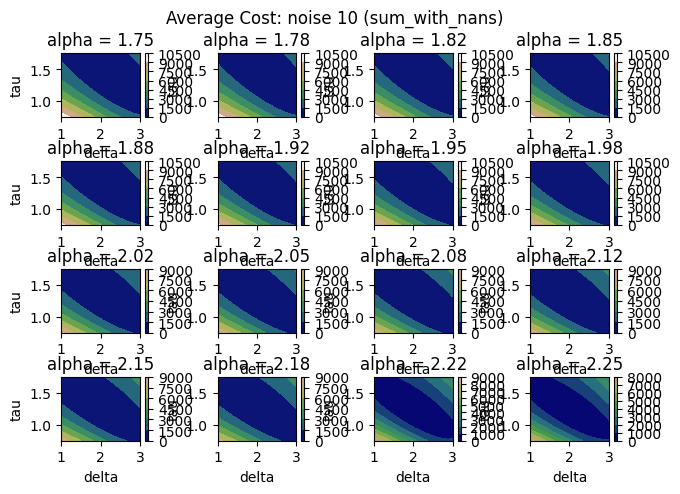

In [46]:
model_name = 'sum_with_nans'
for noise in noise_range:
    df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]

    average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
    average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
    plot_all_search_results_2d(average_df, separate_by='alpha')

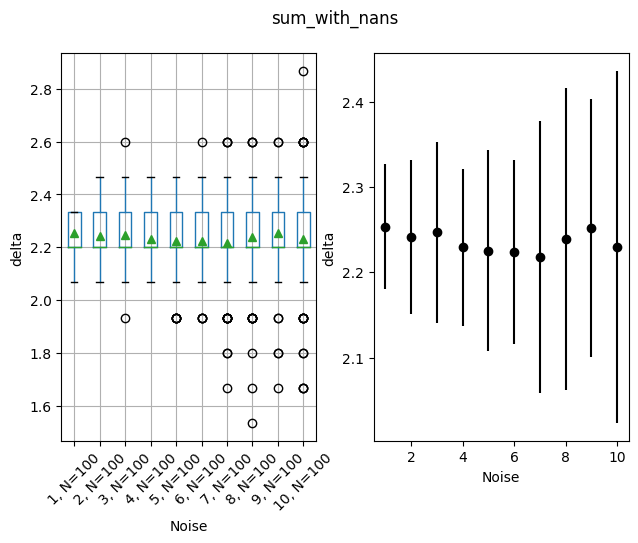

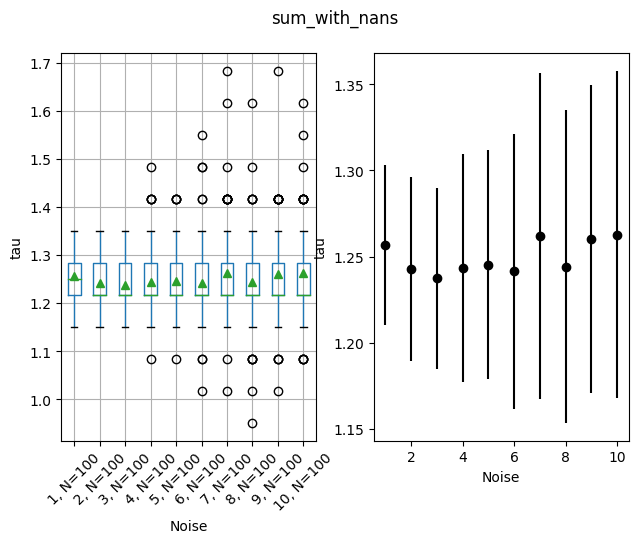

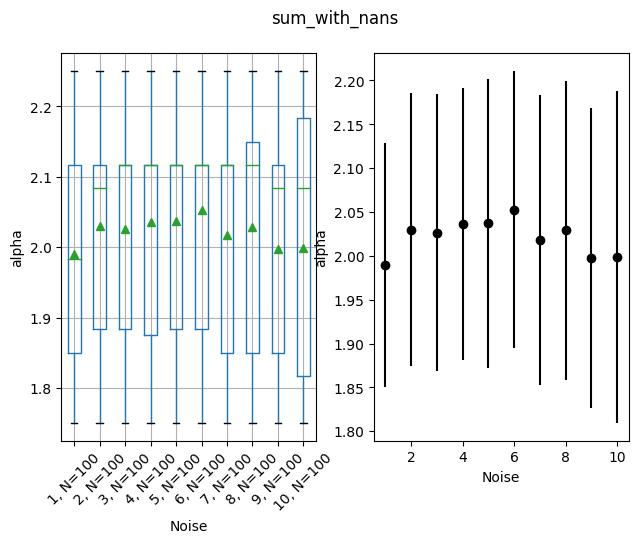

In [125]:
data = []
df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
for noise in noise_range:
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]
    for point in zip(*np.where(~np.isnan(df[columns_for_noise][df[columns_for_noise] == df[columns_for_noise].min()].to_numpy()))):
        row_of_interest = df.iloc[point[0]]
        data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])

chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable in ['delta', 'tau', 'alpha']:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(model_name)
    fig.tight_layout()
    axs[0].set_ylabel(variable)
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_ylabel(variable)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(noise_range, chosen_points.mean()[variable], chosen_points.std()[variable], fmt='ok')
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()

## Local Minima Analysis

### Downsample without missing data

In [126]:
model = df['model_name'].unique()[0]
print(f"For Model '{model}'")
portion_df = df[df['model_name'] == model].drop(columns='model_name')
delta_unique_values = portion_df['delta'].unique()    
tau_unique_values = portion_df['tau'].unique()
alpha_unique_values = portion_df['alpha'].unique()
new_shape = (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size)
delta_pts = np.reshape(portion_df['delta'].values, new_shape)
tau_pts = np.reshape(portion_df['tau'].values, new_shape)
alpha_pts = np.reshape(portion_df['alpha'].values, new_shape)

For Model 'downsample_without_nans'


In [127]:
# Find local minima
columns = portion_df.columns.drop(['delta', 'tau', 'alpha'])
     
m = np.reshape(
    portion_df[columns].values.astype(float), 
    (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size, columns.size)
)

f1 = np.ones((3,3,3,1))
f1[1, 1, 1, 0] = 0
is_minima = m < scipy.ndimage.minimum_filter(m, footprint=f1, mode='constant', cval=np.inf)

In [128]:
local_minima_pts = np.array([pt for pt in zip(*np.where(is_minima))])
local_minima = []
for noise in noise_range:
    columns_with_given_noise = np.where(np.char.startswith(np.array(columns).astype(str), f'{noise}noise'))[0]
    local_minima_with_given_noise = local_minima_pts[np.where(np.isin(local_minima_pts[:,3], columns_with_given_noise))[0],:]
    for point in local_minima_with_given_noise:
        point_as_list = tuple(point.tolist())
        local_minima.append({
            'noise': noise,
            'iteration': columns[point[-1]].split('trial')[-1],
            'cost': m[point_as_list],
            'delta': delta_pts[point_as_list[:-1]],
            'tau': tau_pts[point_as_list[:-1]],
            'alpha': alpha_pts[point_as_list[:-1]]
        })

local_minima_by_noise = pd.DataFrame(local_minima)
local_minima_by_noise


,noise,iteration,cost,delta,tau,alpha
0,1,4,0.943726,2.066667,1.216667,2.216667
1,1,5,0.990123,2.066667,1.216667,2.216667
2,1,6,1.037518,2.066667,1.216667,2.216667
3,1,14,1.028597,2.066667,1.216667,2.216667
4,1,19,1.013952,2.066667,1.216667,2.216667
...,...,...,...,...,...,...
4808,10,55,105.881756,2.733333,1.283333,1.750000
4809,10,83,95.519679,2.733333,1.283333,1.750000
4810,10,6,102.022525,2.733333,1.283333,1.783333
4811,10,63,100.022554,2.733333,1.283333,1.783333


In [129]:
num_local_minima = local_minima_by_noise.drop(columns=['delta', 'tau', 'alpha']).groupby(['noise', 'iteration']).count()

num_local_minima.rename(columns={'cost': 'Number of Local Minima'}).groupby('noise').mean()

,Number of Local Minima
noise,
1,4.99
2,4.89
3,4.82
4,4.90
5,4.80
6,4.79
7,4.79
8,4.77
9,4.66


#### Local minima at edges

In [130]:
# Delta Min
delta_min = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.min()]
delta_min

,noise,iteration,cost,delta,tau,alpha


In [131]:
# Delta Max
delta_max = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.max()]
delta_max

,noise,iteration,cost,delta,tau,alpha


In [132]:
# Tau Min
tau_min = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.min()]
tau_min

,noise,iteration,cost,delta,tau,alpha


In [133]:
# Tau Max
tau_max = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.max()]
tau_max

,noise,iteration,cost,delta,tau,alpha


In [134]:
# Alpha Min
alpha_min = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.min()]
alpha_min

,noise,iteration,cost,delta,tau,alpha
400,1,2,1.082307,2.333333,1.350000,1.75
401,1,4,0.951451,2.333333,1.350000,1.75
402,1,5,0.979204,2.333333,1.350000,1.75
403,1,6,1.019557,2.333333,1.350000,1.75
404,1,7,0.987097,2.333333,1.350000,1.75
...,...,...,...,...,...,...
4806,10,92,100.661792,2.733333,1.216667,1.75
4807,10,19,94.504396,2.733333,1.283333,1.75
4808,10,55,105.881756,2.733333,1.283333,1.75
4809,10,83,95.519679,2.733333,1.283333,1.75


In [187]:
alpha_min.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                  
      count unique                top freq count unique   top freq
noise                                                             
1       100      1  2.333333333333333  100   100      1  1.35  100
10       86      2  2.333333333333333   83    86      2  1.35   83
2       100      1  2.333333333333333  100   100      1  1.35  100
3       100      1  2.333333333333333  100   100      1  1.35  100
4        98      1  2.333333333333333   98    98      1  1.35   98
5        97      1  2.333333333333333   97    97      1  1.35   97
6        95      1  2.333333333333333   95    95      1  1.35   95
7        94      2  2.333333333333333   92    94      2  1.35   92
8        88      2  2.333333333333333   85    88      2  1.35   85
9        86      2  2.333333333333333   84    86      2  1.35   84

In [136]:
# Alpha Max
alpha_max = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.max()]
alpha_max

,noise,iteration,cost,delta,tau,alpha
34,1,0,1.024455,2.066667,1.216667,2.25
35,1,3,1.083417,2.066667,1.216667,2.25
36,1,8,0.884348,2.066667,1.216667,2.25
37,1,9,0.989910,2.066667,1.216667,2.25
38,1,11,0.967723,2.066667,1.216667,2.25
...,...,...,...,...,...,...
4665,10,86,99.701138,2.333333,1.216667,2.25
4717,10,41,98.530735,2.466667,1.083333,2.25
4718,10,92,100.591923,2.466667,1.083333,2.25
4727,10,55,106.044534,2.466667,1.150000,2.25


In [188]:
alpha_max.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                    tau                  
      count unique  top freq count unique   top freq
noise                                               
1         2      1  2.2    2     2      1  1.15    2
10       59      2  2.2   36    59      2  1.15   36
2        21      2  2.2   19    21      2  1.15   19
3        30      2  2.2   23    30      2  1.15   23
4        35      2  2.2   25    35      2  1.15   25
5        49      2  2.2   37    49      2  1.15   37
6        48      2  2.2   34    48      2  1.15   34
7        54      2  2.2   33    54      2  1.15   33
8        60      2  2.2   41    60      2  1.15   41
9        65      2  2.2   45    65      2  1.15   45

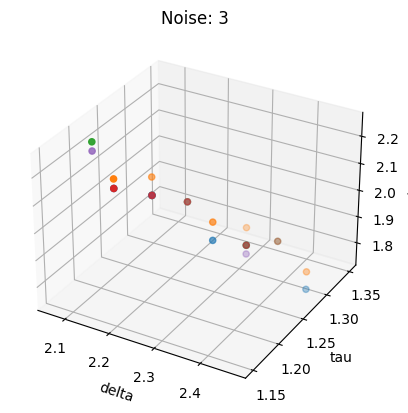

In [138]:
noise = 3
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

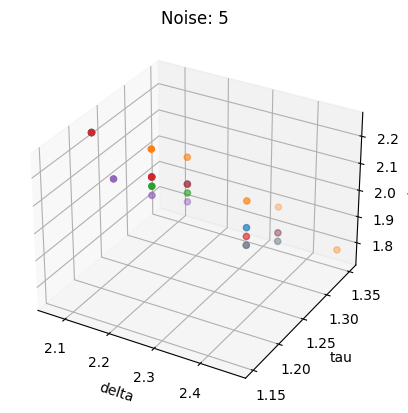

In [139]:
noise = 5
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

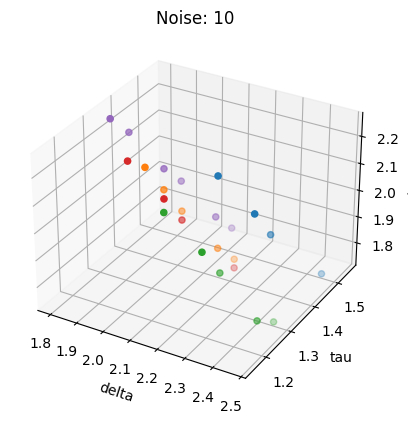

In [140]:
noise = 10
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

### Downsample with missing data

In [141]:
model = df['model_name'].unique()[1]
print(f"For Model '{model}'")
portion_df = df[df['model_name'] == model].drop(columns='model_name')
delta_unique_values = portion_df['delta'].unique()    
tau_unique_values = portion_df['tau'].unique()
alpha_unique_values = portion_df['alpha'].unique()
new_shape = (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size)
delta_pts = np.reshape(portion_df['delta'].values, new_shape)
tau_pts = np.reshape(portion_df['tau'].values, new_shape)
alpha_pts = np.reshape(portion_df['alpha'].values, new_shape)

For Model 'downsample_with_nans'


In [142]:
# Find local minima
columns = portion_df.columns.drop(['delta', 'tau', 'alpha'])
     
m = np.reshape(
    portion_df[columns].values.astype(float), 
    (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size, columns.size)
)

f1 = np.ones((3,3,3,1))
f1[1, 1, 1, 0] = 0
is_minima = m < scipy.ndimage.minimum_filter(m, footprint=f1, mode='constant', cval=np.inf)

In [143]:
local_minima_pts = np.array([pt for pt in zip(*np.where(is_minima))])
local_minima = []
for noise in noise_range:
    columns_with_given_noise = np.where(np.char.startswith(np.array(columns).astype(str), f'{noise}noise'))[0]
    local_minima_with_given_noise = local_minima_pts[np.where(np.isin(local_minima_pts[:,3], columns_with_given_noise))[0],:]
    for point in local_minima_with_given_noise:
        point_as_list = tuple(point.tolist())
        local_minima.append({
            'noise': noise,
            'iteration': columns[point[-1]].split('trial')[-1],
            'cost': m[point_as_list],
            'delta': delta_pts[point_as_list[:-1]],
            'tau': tau_pts[point_as_list[:-1]],
            'alpha': alpha_pts[point_as_list[:-1]]
        })

local_minima_by_noise = pd.DataFrame(local_minima)
local_minima_by_noise


,noise,iteration,cost,delta,tau,alpha
0,1,19,0.969188,2.066667,1.216667,2.183333
1,1,89,1.000644,2.066667,1.216667,2.183333
2,1,92,1.159235,2.066667,1.216667,2.183333
3,1,2,1.071361,2.066667,1.216667,2.216667
4,1,4,0.950277,2.066667,1.216667,2.216667
...,...,...,...,...,...,...
4732,10,55,100.852267,2.866667,1.150000,1.816667
4733,10,92,102.212411,2.866667,1.150000,1.816667
4734,10,63,96.492192,2.866667,1.283333,1.750000
4735,10,53,105.060076,3.000000,1.016667,1.750000


In [144]:
num_local_minima = local_minima_by_noise.drop(columns=['delta', 'tau', 'alpha']).groupby(['noise', 'iteration']).count()

num_local_minima.rename(columns={'cost': 'Number of Local Minima'}).groupby('noise').mean()

,Number of Local Minima
noise,
1,5.00
2,4.90
3,4.77
4,4.82
5,4.76
6,4.86
7,4.76
8,4.59
9,4.55


#### Local minima at edges

In [145]:
# Delta Min
delta_min = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.min()]
delta_min

,noise,iteration,cost,delta,tau,alpha


In [146]:
# Delta Max
delta_max = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.max()]
delta_max

,noise,iteration,cost,delta,tau,alpha
3386,7,5,54.253003,3.0,1.083333,1.75
4735,10,53,105.060076,3.0,1.016667,1.75
4736,10,55,100.853431,3.0,1.150000,1.75


In [147]:
# Tau Min
tau_min = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.min()]
tau_min

,noise,iteration,cost,delta,tau,alpha


In [148]:
# Tau Max
tau_max = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.max()]
tau_max

,noise,iteration,cost,delta,tau,alpha
4304,10,72,97.150954,1.533333,1.75,1.983333
4310,10,72,97.153669,1.666667,1.75,1.883333


In [149]:
# Alpha Min
alpha_min = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.min()]
alpha_min

,noise,iteration,cost,delta,tau,alpha
400,1,1,0.952140,2.333333,1.350000,1.75
401,1,2,1.088525,2.333333,1.350000,1.75
402,1,4,0.964384,2.333333,1.350000,1.75
403,1,5,0.978593,2.333333,1.350000,1.75
404,1,6,0.999328,2.333333,1.350000,1.75
...,...,...,...,...,...,...
4723,10,74,103.406812,2.733333,1.283333,1.75
4727,10,6,101.615832,2.733333,1.350000,1.75
4734,10,63,96.492192,2.866667,1.283333,1.75
4735,10,53,105.060076,3.000000,1.016667,1.75


In [189]:
alpha_min.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                  
      count unique                top freq count unique   top freq
noise                                                             
1       100      1  2.333333333333333  100   100      1  1.35  100
10       86      2  2.333333333333333   83    86      2  1.35   83
2       100      1  2.333333333333333  100   100      1  1.35  100
3       100      1  2.333333333333333  100   100      1  1.35  100
4        98      1  2.333333333333333   98    98      1  1.35   98
5        97      1  2.333333333333333   97    97      1  1.35   97
6        95      1  2.333333333333333   95    95      1  1.35   95
7        94      2  2.333333333333333   92    94      2  1.35   92
8        88      2  2.333333333333333   85    88      2  1.35   85
9        86      2  2.333333333333333   84    86      2  1.35   84

In [151]:
# Alpha Max
alpha_max = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.max()]
alpha_max

,noise,iteration,cost,delta,tau,alpha
34,1,0,1.085735,2.066667,1.216667,2.25
35,1,3,1.083515,2.066667,1.216667,2.25
36,1,8,0.903908,2.066667,1.216667,2.25
37,1,9,0.973413,2.066667,1.216667,2.25
38,1,11,0.931807,2.066667,1.216667,2.25
...,...,...,...,...,...,...
4640,10,25,97.241458,2.466667,1.016667,2.25
4647,10,76,107.648063,2.466667,1.083333,2.25
4659,10,74,103.489156,2.466667,1.150000,2.25
4697,10,63,96.469595,2.600000,1.150000,2.25


In [190]:
alpha_max.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                    tau                  
      count unique  top freq count unique   top freq
noise                                               
1         2      1  2.2    2     2      1  1.15    2
10       59      2  2.2   36    59      2  1.15   36
2        21      2  2.2   19    21      2  1.15   19
3        30      2  2.2   23    30      2  1.15   23
4        35      2  2.2   25    35      2  1.15   25
5        49      2  2.2   37    49      2  1.15   37
6        48      2  2.2   34    48      2  1.15   34
7        54      2  2.2   33    54      2  1.15   33
8        60      2  2.2   41    60      2  1.15   41
9        65      2  2.2   45    65      2  1.15   45

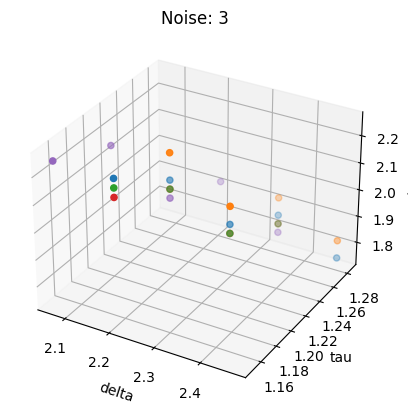

In [153]:
noise = 3
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

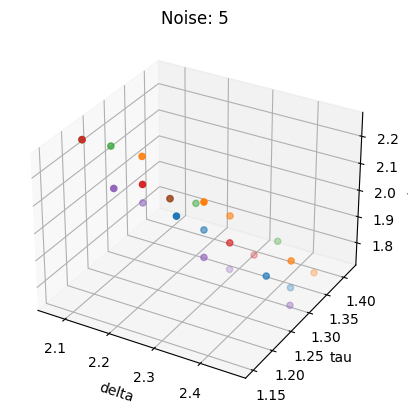

In [154]:
noise = 5
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

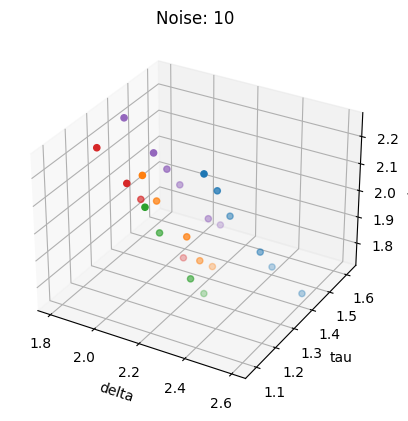

In [155]:
noise = 10
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

### Sum without missing data

In [156]:
model = df['model_name'].unique()[2]
print(f"For Model '{model}'")
portion_df = df[df['model_name'] == model].drop(columns='model_name')
delta_unique_values = portion_df['delta'].unique()    
tau_unique_values = portion_df['tau'].unique()
alpha_unique_values = portion_df['alpha'].unique()
new_shape = (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size)
delta_pts = np.reshape(portion_df['delta'].values, new_shape)
tau_pts = np.reshape(portion_df['tau'].values, new_shape)
alpha_pts = np.reshape(portion_df['alpha'].values, new_shape)

For Model 'sum_without_nans'


In [157]:
# Find local minima
columns = portion_df.columns.drop(['delta', 'tau', 'alpha'])
     
m = np.reshape(
    portion_df[columns].values.astype(float), 
    (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size, columns.size)
)

f1 = np.ones((3,3,3,1))
f1[1, 1, 1, 0] = 0
is_minima = m < scipy.ndimage.minimum_filter(m, footprint=f1, mode='constant', cval=np.inf)

In [158]:
local_minima_pts = np.array([pt for pt in zip(*np.where(is_minima))])
local_minima = []
for noise in noise_range:
    columns_with_given_noise = np.where(np.char.startswith(np.array(columns).astype(str), f'{noise}noise'))[0]
    local_minima_with_given_noise = local_minima_pts[np.where(np.isin(local_minima_pts[:,3], columns_with_given_noise))[0],:]
    for point in local_minima_with_given_noise:
        point_as_list = tuple(point.tolist())
        local_minima.append({
            'noise': noise,
            'iteration': columns[point[-1]].split('trial')[-1],
            'cost': m[point_as_list],
            'delta': delta_pts[point_as_list[:-1]],
            'tau': tau_pts[point_as_list[:-1]],
            'alpha': alpha_pts[point_as_list[:-1]]
        })

local_minima_by_noise = pd.DataFrame(local_minima)
local_minima_by_noise


,noise,iteration,cost,delta,tau,alpha
0,1,0,5.106804,2.066667,1.216667,2.216667
1,1,1,5.291570,2.066667,1.216667,2.216667
2,1,2,5.206043,2.066667,1.216667,2.216667
3,1,3,5.257595,2.066667,1.216667,2.216667
4,1,4,5.283973,2.066667,1.216667,2.216667
...,...,...,...,...,...,...
4995,10,85,102.787058,2.333333,1.350000,1.783333
4996,10,0,101.721354,2.466667,1.283333,1.750000
4997,10,28,112.146267,2.466667,1.283333,1.750000
4998,10,34,103.753206,2.466667,1.283333,1.750000


In [159]:
num_local_minima = local_minima_by_noise.drop(columns=['delta', 'tau', 'alpha']).groupby(['noise', 'iteration']).count()

num_local_minima.rename(columns={'cost': 'Number of Local Minima'}).groupby('noise').mean()

,Number of Local Minima
noise,
1,5.0
2,5.0
3,5.0
4,5.0
5,5.0
6,5.0
7,5.0
8,5.0
9,5.0


#### Local minima at edges

In [160]:
# Delta Min
delta_min = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.min()]
delta_min

,noise,iteration,cost,delta,tau,alpha


In [161]:
# Delta Max
delta_max = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.max()]
delta_max

,noise,iteration,cost,delta,tau,alpha


In [162]:
# Tau Min
tau_min = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.min()]
tau_min

,noise,iteration,cost,delta,tau,alpha


In [163]:
# Tau Max
tau_max = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.max()]
tau_max

,noise,iteration,cost,delta,tau,alpha


In [164]:
# Alpha Min
alpha_min = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.min()]
alpha_min

,noise,iteration,cost,delta,tau,alpha
400,1,0,3.848544,2.333333,1.350000,1.75
401,1,1,4.049567,2.333333,1.350000,1.75
402,1,2,3.924305,2.333333,1.350000,1.75
403,1,3,4.054305,2.333333,1.350000,1.75
404,1,4,3.830204,2.333333,1.350000,1.75
...,...,...,...,...,...,...
4992,10,99,114.695511,2.333333,1.350000,1.75
4996,10,0,101.721354,2.466667,1.283333,1.75
4997,10,28,112.146267,2.466667,1.283333,1.75
4998,10,34,103.753206,2.466667,1.283333,1.75


In [191]:
alpha_min.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                  
      count unique                top freq count unique   top freq
noise                                                             
1       100      1  2.333333333333333  100   100      1  1.35  100
10       86      2  2.333333333333333   83    86      2  1.35   83
2       100      1  2.333333333333333  100   100      1  1.35  100
3       100      1  2.333333333333333  100   100      1  1.35  100
4        98      1  2.333333333333333   98    98      1  1.35   98
5        97      1  2.333333333333333   97    97      1  1.35   97
6        95      1  2.333333333333333   95    95      1  1.35   95
7        94      2  2.333333333333333   92    94      2  1.35   92
8        88      2  2.333333333333333   85    88      2  1.35   85
9        86      2  2.333333333333333   84    86      2  1.35   84

In [166]:
# Alpha Max
alpha_max = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.max()]
alpha_max

,noise,iteration,cost,delta,tau,alpha
595,2,15,8.489169,2.066667,1.216667,2.25
596,2,9,8.496160,2.200000,1.150000,2.25
597,2,16,8.993838,2.200000,1.150000,2.25
598,2,66,8.878377,2.200000,1.150000,2.25
599,2,82,8.761062,2.200000,1.150000,2.25
...,...,...,...,...,...,...
4595,10,90,100.421811,2.200000,1.150000,2.25
4596,10,92,94.467064,2.200000,1.150000,2.25
4597,10,96,97.099379,2.200000,1.150000,2.25
4598,10,98,105.973841,2.200000,1.150000,2.25


In [192]:
alpha_max.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                    tau                  
      count unique  top freq count unique   top freq
noise                                               
1         2      1  2.2    2     2      1  1.15    2
10       59      2  2.2   36    59      2  1.15   36
2        21      2  2.2   19    21      2  1.15   19
3        30      2  2.2   23    30      2  1.15   23
4        35      2  2.2   25    35      2  1.15   25
5        49      2  2.2   37    49      2  1.15   37
6        48      2  2.2   34    48      2  1.15   34
7        54      2  2.2   33    54      2  1.15   33
8        60      2  2.2   41    60      2  1.15   41
9        65      2  2.2   45    65      2  1.15   45

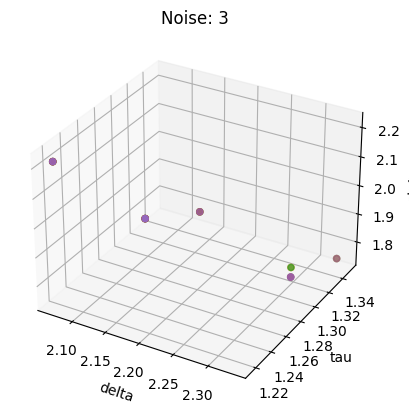

In [168]:
noise = 3
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

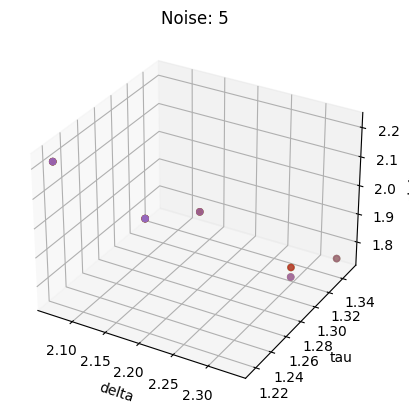

In [169]:
noise = 5
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

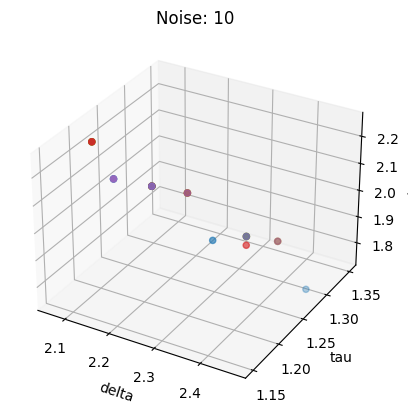

In [170]:
noise = 10
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

### Sum with missing Data

In [171]:
model = df['model_name'].unique()[3]
print(f"For Model '{model}'")
portion_df = df[df['model_name'] == model].drop(columns='model_name')
delta_unique_values = portion_df['delta'].unique()    
tau_unique_values = portion_df['tau'].unique()
alpha_unique_values = portion_df['alpha'].unique()
new_shape = (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size)
delta_pts = np.reshape(portion_df['delta'].values, new_shape)
tau_pts = np.reshape(portion_df['tau'].values, new_shape)
alpha_pts = np.reshape(portion_df['alpha'].values, new_shape)

For Model 'sum_with_nans'


In [172]:
# Find local minima
columns = portion_df.columns.drop(['delta', 'tau', 'alpha'])
     
m = np.reshape(
    portion_df[columns].values.astype(float), 
    (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size, columns.size)
)

f1 = np.ones((3,3,3,1))
f1[1, 1, 1, 0] = 0
is_minima = m < scipy.ndimage.minimum_filter(m, footprint=f1, mode='constant', cval=np.inf)

In [173]:
local_minima_pts = np.array([pt for pt in zip(*np.where(is_minima))])
local_minima = []
for noise in noise_range:
    columns_with_given_noise = np.where(np.char.startswith(np.array(columns).astype(str), f'{noise}noise'))[0]
    local_minima_with_given_noise = local_minima_pts[np.where(np.isin(local_minima_pts[:,3], columns_with_given_noise))[0],:]
    for point in local_minima_with_given_noise:
        point_as_list = tuple(point.tolist())
        local_minima.append({
            'noise': noise,
            'iteration': columns[point[-1]].split('trial')[-1],
            'cost': m[point_as_list],
            'delta': delta_pts[point_as_list[:-1]],
            'tau': tau_pts[point_as_list[:-1]],
            'alpha': alpha_pts[point_as_list[:-1]]
        })

local_minima_by_noise = pd.DataFrame(local_minima)
local_minima_by_noise


,noise,iteration,cost,delta,tau,alpha
0,1,0,5.318308,2.066667,1.216667,2.216667
1,1,1,5.408439,2.066667,1.216667,2.216667
2,1,2,5.408257,2.066667,1.216667,2.216667
3,1,3,5.451136,2.066667,1.216667,2.216667
4,1,4,5.481482,2.066667,1.216667,2.216667
...,...,...,...,...,...,...
4995,10,85,102.170607,2.333333,1.350000,1.783333
4996,10,96,98.145468,2.333333,1.350000,1.783333
4997,10,28,112.444819,2.466667,1.283333,1.750000
4998,10,34,101.292773,2.466667,1.283333,1.750000


In [174]:
num_local_minima = local_minima_by_noise.drop(columns=['delta', 'tau', 'alpha']).groupby(['noise', 'iteration']).count()

num_local_minima.rename(columns={'cost': 'Number of Local Minima'}).groupby('noise').mean()

,Number of Local Minima
noise,
1,5.0
2,5.0
3,5.0
4,5.0
5,5.0
6,5.0
7,5.0
8,5.0
9,5.0


#### Local minima at edges

In [175]:
# Delta Min
delta_min = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.min()]
delta_min

,noise,iteration,cost,delta,tau,alpha


In [176]:
# Delta Max
delta_max = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.max()]
delta_max

,noise,iteration,cost,delta,tau,alpha


In [177]:
# Tau Min
tau_min = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.min()]
tau_min

,noise,iteration,cost,delta,tau,alpha


In [178]:
# Tau Max
tau_max = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.max()]
tau_max

,noise,iteration,cost,delta,tau,alpha


In [179]:
# Alpha Min
alpha_min = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.min()]
alpha_min

,noise,iteration,cost,delta,tau,alpha
400,1,0,3.826586,2.333333,1.350000,1.75
401,1,1,3.915235,2.333333,1.350000,1.75
402,1,2,3.732037,2.333333,1.350000,1.75
403,1,3,4.037883,2.333333,1.350000,1.75
404,1,4,3.825990,2.333333,1.350000,1.75
...,...,...,...,...,...,...
4981,10,97,94.146723,2.333333,1.350000,1.75
4982,10,99,113.279336,2.333333,1.350000,1.75
4997,10,28,112.444819,2.466667,1.283333,1.75
4998,10,34,101.292773,2.466667,1.283333,1.75


In [193]:
alpha_min.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                  
      count unique                top freq count unique   top freq
noise                                                             
1       100      1  2.333333333333333  100   100      1  1.35  100
10       86      2  2.333333333333333   83    86      2  1.35   83
2       100      1  2.333333333333333  100   100      1  1.35  100
3       100      1  2.333333333333333  100   100      1  1.35  100
4        98      1  2.333333333333333   98    98      1  1.35   98
5        97      1  2.333333333333333   97    97      1  1.35   97
6        95      1  2.333333333333333   95    95      1  1.35   95
7        94      2  2.333333333333333   92    94      2  1.35   92
8        88      2  2.333333333333333   85    88      2  1.35   85
9        86      2  2.333333333333333   84    86      2  1.35   84

In [181]:
# Alpha Max
alpha_max = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.max()]
alpha_max

,noise,iteration,cost,delta,tau,alpha
98,1,86,5.703711,2.200000,1.150000,2.25
99,1,93,5.688546,2.200000,1.150000,2.25
579,2,15,8.727492,2.066667,1.216667,2.25
580,2,40,8.729799,2.066667,1.216667,2.25
581,2,4,8.666827,2.200000,1.150000,2.25
...,...,...,...,...,...,...
4595,10,89,100.430539,2.200000,1.150000,2.25
4596,10,90,96.008998,2.200000,1.150000,2.25
4597,10,92,98.527562,2.200000,1.150000,2.25
4598,10,96,96.661753,2.200000,1.150000,2.25


In [194]:
alpha_max.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                    tau                  
      count unique  top freq count unique   top freq
noise                                               
1         2      1  2.2    2     2      1  1.15    2
10       59      2  2.2   36    59      2  1.15   36
2        21      2  2.2   19    21      2  1.15   19
3        30      2  2.2   23    30      2  1.15   23
4        35      2  2.2   25    35      2  1.15   25
5        49      2  2.2   37    49      2  1.15   37
6        48      2  2.2   34    48      2  1.15   34
7        54      2  2.2   33    54      2  1.15   33
8        60      2  2.2   41    60      2  1.15   41
9        65      2  2.2   45    65      2  1.15   45

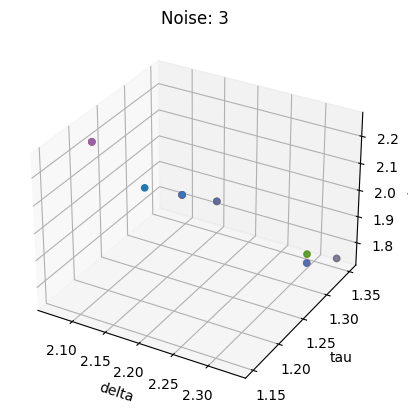

In [183]:
noise = 3
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

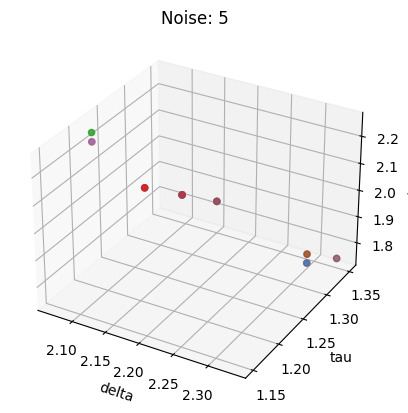

In [184]:
noise = 5
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

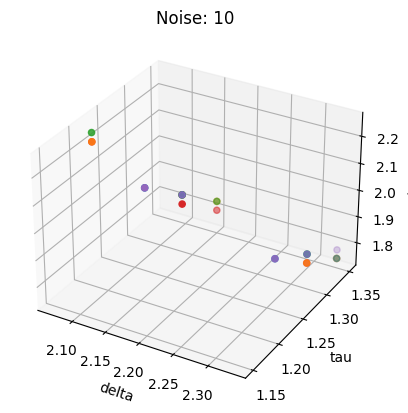

In [185]:
noise = 10
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()